## CLIENT PROJECT

### CONNECTING TO DATABASE

In [1]:
!pip install pymysql

In [3]:
import pymysql
import pandas as pd
# Connect to MySQL
conn = pymysql.connect(
    host="18.136.157.135",
    user="dm_team",
    password="DM!$Team@&27920!",
    database="project_itsm"
)
print("Connection successfull")

Connection successfull


In [4]:
# Create cursor to run SQL commands
cursor = conn.cursor()
# Show all tables
cursor.execute("SHOW TABLES;")
tables = cursor.fetchall()
# Print them
print("Available tables in the database:")
for table in tables:
    print(table[0])
cursor.close()

Available tables in the database:
dataset_list


In [7]:
# Load the data into a pandas DataFrame
data = pd.read_sql("SELECT * FROM dataset_list;", conn)
# Close the DB connection after loading
conn.close()
# Preview the data
data.shape, data.head()

C:\Users\Windows\AppData\Local\Temp\ipykernel_6536\973538156.py:2: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  data = pd.read_sql("SELECT * FROM dataset_list;", conn)


((46606, 25),
      CI_Name          CI_Cat              CI_Subcat        WBS Incident_ID  \
 0  SUB000508  subapplication  Web Based Application  WBS000162   IM0000004   
 1  WBA000124     application  Web Based Application  WBS000088   IM0000005   
 2  DTA000024     application    Desktop Application  WBS000092   IM0000006   
 3  WBA000124     application  Web Based Application  WBS000088   IM0000011   
 4  WBA000124     application  Web Based Application  WBS000088   IM0000012   
 
    Status Impact Urgency Priority   number_cnt  ...       Reopen_Time  \
 0  Closed      4       4        4  0.601292279  ...                     
 1  Closed      3       3        3  0.415049969  ...  02-12-2013 12:31   
 2  Closed     NS       3       NA  0.517551335  ...                     
 3  Closed      4       4        4  0.642927218  ...                     
 4  Closed      4       4        4  0.345258343  ...                     
 
       Resolved_Time        Close_Time Handle_Time_hrs  \
 0  04

In [9]:
#Saving to our system
data.to_csv("internship.csv", index=False)
print("Data saved")

Data saved


In [11]:
#Checking the data 
data 

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,...,Reopen_Time,Resolved_Time,Close_Time,Handle_Time_hrs,Closure_Code,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Related_Change
0,SUB000508,subapplication,Web Based Application,WBS000162,IM0000004,Closed,4,4,4,0.601292279,...,,04-11-2013 13:50,04-11-2013 13:51,"3,87,16,91,111",Other,1,SD0000007,2,,
1,WBA000124,application,Web Based Application,WBS000088,IM0000005,Closed,3,3,3,0.415049969,...,02-12-2013 12:31,02-12-2013 12:36,02-12-2013 12:36,"4,35,47,86,389",Software,1,SD0000011,1,,
2,DTA000024,application,Desktop Application,WBS000092,IM0000006,Closed,NS,3,NA,0.517551335,...,,13-01-2014 15:12,13-01-2014 15:13,"4,84,31,19,444",No error - works as designed,1,SD0000017,,,
3,WBA000124,application,Web Based Application,WBS000088,IM0000011,Closed,4,4,4,0.642927218,...,,14-11-2013 09:31,14-11-2013 09:31,"4,32,18,33,333",Operator error,1,SD0000025,,,
4,WBA000124,application,Web Based Application,WBS000088,IM0000012,Closed,4,4,4,0.345258343,...,,08-11-2013 13:55,08-11-2013 13:55,"3,38,39,03,333",Other,1,SD0000029,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46601,SBA000464,application,Server Based Application,WBS000073,IM0047053,Closed,4,4,4,0.23189604,...,,31-03-2014 16:29,31-03-2014 16:29,"0,095",Other,1,SD0147021,,,
46602,SBA000461,application,Server Based Application,WBS000073,IM0047054,Closed,4,4,4,0.805153085,...,,31-03-2014 15:29,31-03-2014 15:29,"0,428333333",User error,1,SD0146967,,,
46603,LAP000019,computer,Laptop,WBS000091,IM0047055,Closed,5,5,5,0.917466294,...,,31-03-2014 15:32,31-03-2014 15:32,"0,071666667",Hardware,1,SD0146982,,,
46604,WBA000058,application,Web Based Application,WBS000073,IM0047056,Closed,4,4,4,0.701278158,...,,31-03-2014 15:42,31-03-2014 15:42,"0,116944444",Software,1,SD0146986,,,


### PROBLEM STATEMENT

In [14]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

### BASIC CHECKS

In [17]:
data.head()

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,...,Reopen_Time,Resolved_Time,Close_Time,Handle_Time_hrs,Closure_Code,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Related_Change
0,SUB000508,subapplication,Web Based Application,WBS000162,IM0000004,Closed,4,4,4,0.601292279,...,,04-11-2013 13:50,04-11-2013 13:51,"3,87,16,91,111",Other,1,SD0000007,2,,
1,WBA000124,application,Web Based Application,WBS000088,IM0000005,Closed,3,3,3,0.415049969,...,02-12-2013 12:31,02-12-2013 12:36,02-12-2013 12:36,"4,35,47,86,389",Software,1,SD0000011,1,,
2,DTA000024,application,Desktop Application,WBS000092,IM0000006,Closed,NS,3,NA,0.517551335,...,,13-01-2014 15:12,13-01-2014 15:13,"4,84,31,19,444",No error - works as designed,1,SD0000017,,,
3,WBA000124,application,Web Based Application,WBS000088,IM0000011,Closed,4,4,4,0.642927218,...,,14-11-2013 09:31,14-11-2013 09:31,"4,32,18,33,333",Operator error,1,SD0000025,,,
4,WBA000124,application,Web Based Application,WBS000088,IM0000012,Closed,4,4,4,0.345258343,...,,08-11-2013 13:55,08-11-2013 13:55,"3,38,39,03,333",Other,1,SD0000029,,,


In [19]:
data.tail()

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,...,Reopen_Time,Resolved_Time,Close_Time,Handle_Time_hrs,Closure_Code,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Related_Change
46601,SBA000464,application,Server Based Application,WBS000073,IM0047053,Closed,4,4,4,0.23189604,...,,31-03-2014 16:29,31-03-2014 16:29,"0,095",Other,1,SD0147021,,,
46602,SBA000461,application,Server Based Application,WBS000073,IM0047054,Closed,4,4,4,0.805153085,...,,31-03-2014 15:29,31-03-2014 15:29,"0,428333333",User error,1,SD0146967,,,
46603,LAP000019,computer,Laptop,WBS000091,IM0047055,Closed,5,5,5,0.917466294,...,,31-03-2014 15:32,31-03-2014 15:32,"0,071666667",Hardware,1,SD0146982,,,
46604,WBA000058,application,Web Based Application,WBS000073,IM0047056,Closed,4,4,4,0.701278158,...,,31-03-2014 15:42,31-03-2014 15:42,"0,116944444",Software,1,SD0146986,,,
46605,DCE000077,hardware,DataCenterEquipment,WBS000267,IM0047057,Closed,3,3,3,0.902319509,...,,31-03-2014 22:47,31-03-2014 22:47,"0,586388889",Hardware,1,SD0147088,,,


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46606 entries, 0 to 46605
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   CI_Name                     46606 non-null  object
 1   CI_Cat                      46606 non-null  object
 2   CI_Subcat                   46606 non-null  object
 3   WBS                         46606 non-null  object
 4   Incident_ID                 46606 non-null  object
 5   Status                      46606 non-null  object
 6   Impact                      46606 non-null  object
 7   Urgency                     46606 non-null  object
 8   Priority                    46606 non-null  object
 9   number_cnt                  46606 non-null  object
 10  Category                    46606 non-null  object
 11  KB_number                   46606 non-null  object
 12  Alert_Status                46606 non-null  object
 13  No_of_Reassignments         46606 non-null  ob

In [23]:
duplicate_rows = data[data.duplicated()]
print(duplicate_rows)

Empty DataFrame
Columns: [CI_Name, CI_Cat, CI_Subcat, WBS, Incident_ID, Status, Impact, Urgency, Priority, number_cnt, Category, KB_number, Alert_Status, No_of_Reassignments, Open_Time, Reopen_Time, Resolved_Time, Close_Time, Handle_Time_hrs, Closure_Code, No_of_Related_Interactions, Related_Interaction, No_of_Related_Incidents, No_of_Related_Changes, Related_Change]
Index: []

[0 rows x 25 columns]


In [25]:
data.describe()

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,...,Reopen_Time,Resolved_Time,Close_Time,Handle_Time_hrs,Closure_Code,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Related_Change
count,46606,46606,46606,46606,46606,46606,46606,46606,46606,46606,...,46606,46606,46606,46606,46606,46606,46606,46606,46606,46606
unique,3019,13,65,274,46606,2,6,6,6,46606,...,2245,33628,34528,30639,15,50,43060,25,5,233
top,SUB000456,application,Server Based Application,WBS000073,IM0000004,Closed,4,4,4,0.601292279,...,,,02-10-2013 15:20,0,Other,1,#MULTIVALUE,,,
freq,3050,32900,18811,13342,1,46597,22556,22588,22717,1,...,44322,1780,21,236,16470,43058,3434,45384,46046,46046


In [27]:
data.describe(include='O')

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,...,Reopen_Time,Resolved_Time,Close_Time,Handle_Time_hrs,Closure_Code,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Related_Change
count,46606,46606,46606,46606,46606,46606,46606,46606,46606,46606,...,46606,46606,46606,46606,46606,46606,46606,46606,46606,46606
unique,3019,13,65,274,46606,2,6,6,6,46606,...,2245,33628,34528,30639,15,50,43060,25,5,233
top,SUB000456,application,Server Based Application,WBS000073,IM0000004,Closed,4,4,4,0.601292279,...,,,02-10-2013 15:20,0,Other,1,#MULTIVALUE,,,
freq,3050,32900,18811,13342,1,46597,22556,22588,22717,1,...,44322,1780,21,236,16470,43058,3434,45384,46046,46046


### DATA PREPROCESSING/CLEANING

In [30]:
#Convert to datetime 
date_cols = ['Open_Time', 'Reopen_Time', 'Resolved_Time', 'Close_Time']
for col in date_cols:
    data[col] = pd.to_datetime(data[col], errors='coerce')

In [32]:
#Convert to numerical
num_cols = [
    'Impact', 'Urgency', 'Priority', 'No_of_Reassignments',
    'Handle_Time_hrs', 'No_of_Related_Interactions',
    'No_of_Related_Incidents', 'No_of_Related_Changes'
]
for col in num_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

In [34]:
#Checking the datatypes whether changed or not
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46606 entries, 0 to 46605
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   CI_Name                     46606 non-null  object        
 1   CI_Cat                      46606 non-null  object        
 2   CI_Subcat                   46606 non-null  object        
 3   WBS                         46606 non-null  object        
 4   Incident_ID                 46606 non-null  object        
 5   Status                      46606 non-null  object        
 6   Impact                      45226 non-null  float64       
 7   Urgency                     46605 non-null  float64       
 8   Priority                    45226 non-null  float64       
 9   number_cnt                  46606 non-null  object        
 10  Category                    46606 non-null  object        
 11  KB_number                   46606 non-null  object    

In [36]:
# Check missing values
missing = data.isnull().sum().sort_values(ascending=False)
print(missing[missing > 0])

Handle_Time_hrs               46350
No_of_Related_Changes         46046
Reopen_Time                   45735
No_of_Related_Incidents       45384
Resolved_Time                 29029
Close_Time                    28273
Open_Time                     27994
Impact                         1380
Priority                       1380
No_of_Related_Interactions      114
Urgency                           1
No_of_Reassignments               1
dtype: int64


In [38]:
# Fill missing numeric values with 0
data[num_cols] = data[num_cols].fillna(0)

# Fill missing text fields with 'Unknown'
data.fillna('Unknown', inplace=True)

In [40]:
# Check missing values again
missing1 = data.isnull().sum().sort_values(ascending=False)
print(missing1[missing1 > 0])

Series([], dtype: int64)


In [42]:
#Handle Categorical/Text Columns
cat_cols = ['CI_Cat', 'CI_Subcat', 'Status', 'Category', 'Closure_Code', 'Alert_Status']
# Strip whitespace and lowercase
for col in cat_cols:
    data[col] = data[col].str.strip().str.lower()

In [44]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46606 entries, 0 to 46605
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   CI_Name                     46606 non-null  object 
 1   CI_Cat                      46606 non-null  object 
 2   CI_Subcat                   46606 non-null  object 
 3   WBS                         46606 non-null  object 
 4   Incident_ID                 46606 non-null  object 
 5   Status                      46606 non-null  object 
 6   Impact                      46606 non-null  float64
 7   Urgency                     46606 non-null  float64
 8   Priority                    46606 non-null  float64
 9   number_cnt                  46606 non-null  object 
 10  Category                    46606 non-null  object 
 11  KB_number                   46606 non-null  object 
 12  Alert_Status                46606 non-null  object 
 13  No_of_Reassignments         466

In [46]:
data['Open_Time'] = pd.to_datetime(data['Open_Time'], errors='coerce')
data['Resolved_Time'] = pd.to_datetime(data['Resolved_Time'], errors='coerce')

In [48]:
#Calculating resolution time 
data['Resolution_Hours'] = (data['Resolved_Time'] - data['Open_Time']).dt.total_seconds() / 3600

In [50]:
#Extract Time-Based Features
data['Open_Year'] = data['Open_Time'].dt.year
data['Open_Month'] = data['Open_Time'].dt.month
data['Open_Weekday'] = data['Open_Time'].dt.day_name()
data['Open_Hour'] = data['Open_Time'].dt.hour

In [52]:
data

,CI_Name,CI_Cat,CI_Subcat,WBS,Incident_ID,Status,Impact,Urgency,Priority,number_cnt,...,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Related_Change,Resolution_Hours,Open_Year,Open_Month,Open_Weekday,Open_Hour
0,SUB000508,subapplication,web based application,WBS000162,IM0000004,closed,4.0,4.0,4.0,0.601292279,...,1.0,SD0000007,2.0,0.0,,8256.300000,2012.0,5.0,Wednesday,13.0
1,WBA000124,application,web based application,WBS000088,IM0000005,closed,3.0,3.0,3.0,0.415049969,...,1.0,SD0000011,1.0,0.0,,1700.866667,2012.0,12.0,Monday,15.0
2,DTA000024,application,desktop application,WBS000092,IM0000006,closed,0.0,3.0,0.0,0.517551335,...,1.0,SD0000017,0.0,0.0,,NaN,NaN,NaN,NaN,NaN
3,WBA000124,application,web based application,WBS000088,IM0000011,closed,4.0,4.0,4.0,0.642927218,...,1.0,SD0000025,0.0,0.0,,NaN,NaN,NaN,NaN,NaN
4,WBA000124,application,web based application,WBS000088,IM0000012,closed,4.0,4.0,4.0,0.345258343,...,1.0,SD0000029,0.0,0.0,,7370.900000,2012.0,10.0,Monday,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46601,SBA000464,application,server based application,WBS000073,IM0047053,closed,4.0,4.0,4.0,0.23189604,...,1.0,SD0147021,0.0,0.0,,NaN,NaN,NaN,NaN,NaN
46602,SBA000461,application,server based application,WBS000073,IM0047054,closed,4.0,4.0,4.0,0.805153085,...,1.0,SD0146967,0.0,0.0,,NaN,NaN,NaN,NaN,NaN
46603,LAP000019,computer,laptop,WBS000091,IM0047055,closed,5.0,5.0,5.0,0.917466294,...,1.0,SD0146982,0.0,0.0,,NaN,NaN,NaN,NaN,NaN
46604,WBA000058,application,web based application,WBS000073,IM0047056,closed,4.0,4.0,4.0,0.701278158,...,1.0,SD0146986,0.0,0.0,,NaN,NaN,NaN,NaN,NaN


In [54]:
#Drop Irrelevant or ID Columns--Columns like Incident_ID, WBS, KB_number, and number_cnt are likely unique or identifiers
data.drop(['Incident_ID', 'WBS', 'KB_number', 'number_cnt'], axis=1, inplace=True)

In [56]:
data

,CI_Name,CI_Cat,CI_Subcat,Status,Impact,Urgency,Priority,Category,Alert_Status,No_of_Reassignments,...,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Related_Change,Resolution_Hours,Open_Year,Open_Month,Open_Weekday,Open_Hour
0,SUB000508,subapplication,web based application,closed,4.0,4.0,4.0,incident,closed,26.0,...,1.0,SD0000007,2.0,0.0,,8256.300000,2012.0,5.0,Wednesday,13.0
1,WBA000124,application,web based application,closed,3.0,3.0,3.0,incident,closed,33.0,...,1.0,SD0000011,1.0,0.0,,1700.866667,2012.0,12.0,Monday,15.0
2,DTA000024,application,desktop application,closed,0.0,3.0,0.0,request for information,closed,3.0,...,1.0,SD0000017,0.0,0.0,,NaN,NaN,NaN,NaN,NaN
3,WBA000124,application,web based application,closed,4.0,4.0,4.0,incident,closed,13.0,...,1.0,SD0000025,0.0,0.0,,NaN,NaN,NaN,NaN,NaN
4,WBA000124,application,web based application,closed,4.0,4.0,4.0,incident,closed,2.0,...,1.0,SD0000029,0.0,0.0,,7370.900000,2012.0,10.0,Monday,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46601,SBA000464,application,server based application,closed,4.0,4.0,4.0,incident,closed,0.0,...,1.0,SD0147021,0.0,0.0,,NaN,NaN,NaN,NaN,NaN
46602,SBA000461,application,server based application,closed,4.0,4.0,4.0,incident,closed,0.0,...,1.0,SD0146967,0.0,0.0,,NaN,NaN,NaN,NaN,NaN
46603,LAP000019,computer,laptop,closed,5.0,5.0,5.0,incident,closed,0.0,...,1.0,SD0146982,0.0,0.0,,NaN,NaN,NaN,NaN,NaN
46604,WBA000058,application,web based application,closed,4.0,4.0,4.0,incident,closed,0.0,...,1.0,SD0146986,0.0,0.0,,NaN,NaN,NaN,NaN,NaN


In [58]:
data[['Resolution_Hours', 'Open_Year', 'Open_Month', 'Open_Weekday', 'Open_Hour']].isna().sum()

Resolution_Hours    32434
Open_Year           27994
Open_Month          27994
Open_Weekday        27994
Open_Hour           27994
dtype: int64

In [60]:
data['Resolution_Hours'].fillna(data['Resolution_Hours'].median(), inplace=True)

In [62]:
for col in ['Open_Year', 'Open_Month', 'Open_Hour','Open_Weekday']:
    data[col].fillna(data[col].mode()[0], inplace=True)

In [64]:
data

,CI_Name,CI_Cat,CI_Subcat,Status,Impact,Urgency,Priority,Category,Alert_Status,No_of_Reassignments,...,No_of_Related_Interactions,Related_Interaction,No_of_Related_Incidents,No_of_Related_Changes,Related_Change,Resolution_Hours,Open_Year,Open_Month,Open_Weekday,Open_Hour
0,SUB000508,subapplication,web based application,closed,4.0,4.0,4.0,incident,closed,26.0,...,1.0,SD0000007,2.0,0.0,,8256.300000,2012.0,5.0,Wednesday,13.0
1,WBA000124,application,web based application,closed,3.0,3.0,3.0,incident,closed,33.0,...,1.0,SD0000011,1.0,0.0,,1700.866667,2012.0,12.0,Monday,15.0
2,DTA000024,application,desktop application,closed,0.0,3.0,0.0,request for information,closed,3.0,...,1.0,SD0000017,0.0,0.0,,3.883333,2013.0,4.0,Thursday,10.0
3,WBA000124,application,web based application,closed,4.0,4.0,4.0,incident,closed,13.0,...,1.0,SD0000025,0.0,0.0,,3.883333,2013.0,4.0,Thursday,10.0
4,WBA000124,application,web based application,closed,4.0,4.0,4.0,incident,closed,2.0,...,1.0,SD0000029,0.0,0.0,,7370.900000,2012.0,10.0,Monday,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46601,SBA000464,application,server based application,closed,4.0,4.0,4.0,incident,closed,0.0,...,1.0,SD0147021,0.0,0.0,,3.883333,2013.0,4.0,Thursday,10.0
46602,SBA000461,application,server based application,closed,4.0,4.0,4.0,incident,closed,0.0,...,1.0,SD0146967,0.0,0.0,,3.883333,2013.0,4.0,Thursday,10.0
46603,LAP000019,computer,laptop,closed,5.0,5.0,5.0,incident,closed,0.0,...,1.0,SD0146982,0.0,0.0,,3.883333,2013.0,4.0,Thursday,10.0
46604,WBA000058,application,web based application,closed,4.0,4.0,4.0,incident,closed,0.0,...,1.0,SD0146986,0.0,0.0,,3.883333,2013.0,4.0,Thursday,10.0


In [66]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46606 entries, 0 to 46605
Data columns (total 26 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   CI_Name                     46606 non-null  object        
 1   CI_Cat                      46606 non-null  object        
 2   CI_Subcat                   46606 non-null  object        
 3   Status                      46606 non-null  object        
 4   Impact                      46606 non-null  float64       
 5   Urgency                     46606 non-null  float64       
 6   Priority                    46606 non-null  float64       
 7   Category                    46606 non-null  object        
 8   Alert_Status                46606 non-null  object        
 9   No_of_Reassignments         46606 non-null  float64       
 10  Open_Time                   18612 non-null  datetime64[ns]
 11  Reopen_Time                 46606 non-null  object    

#### Handling Outliers

In [71]:
#firstly seperating the numerical data and categorical data
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()
print(numerical_cols)

['Impact', 'Urgency', 'Priority', 'No_of_Reassignments', 'Handle_Time_hrs', 'No_of_Related_Interactions', 'No_of_Related_Incidents', 'No_of_Related_Changes', 'Resolution_Hours', 'Open_Year', 'Open_Month', 'Open_Hour']


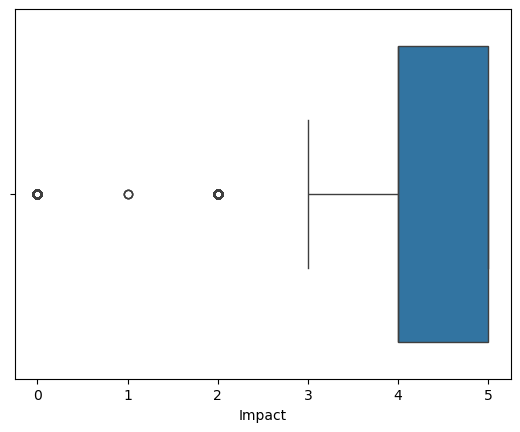

In [73]:
sns.boxplot(x=data.Impact,orient='h')
plt.show()

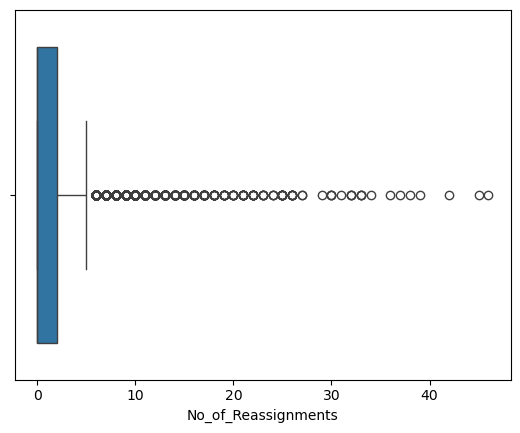

In [74]:
sns.boxplot(x=data.No_of_Reassignments,orient='h')
plt.show()

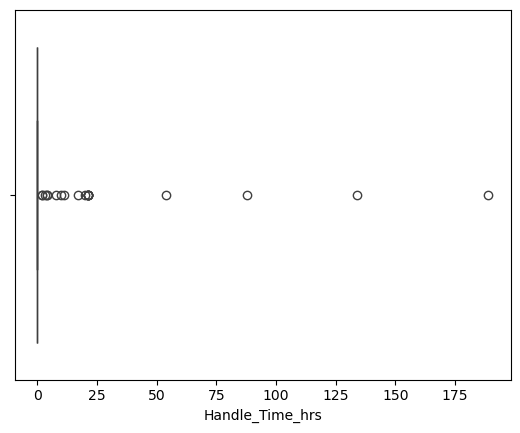

In [76]:
sns.boxplot(x=data.Handle_Time_hrs,orient='h')
plt.show()

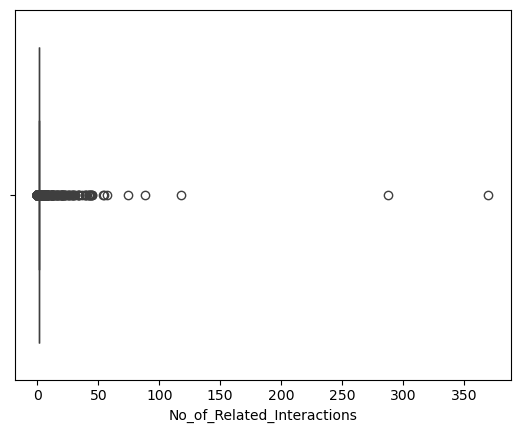

In [78]:
sns.boxplot(x=data.No_of_Related_Interactions,orient='h')
plt.show()

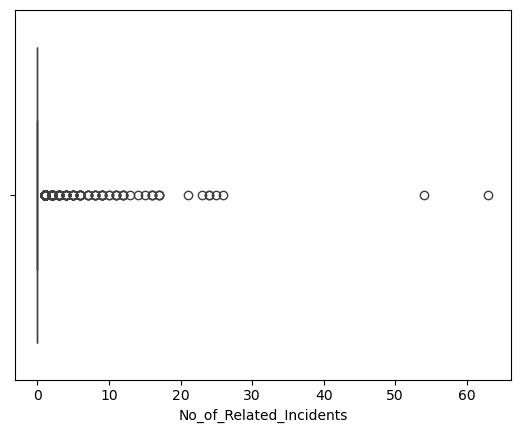

In [80]:
sns.boxplot(x=data.No_of_Related_Incidents,orient='h')
plt.show()

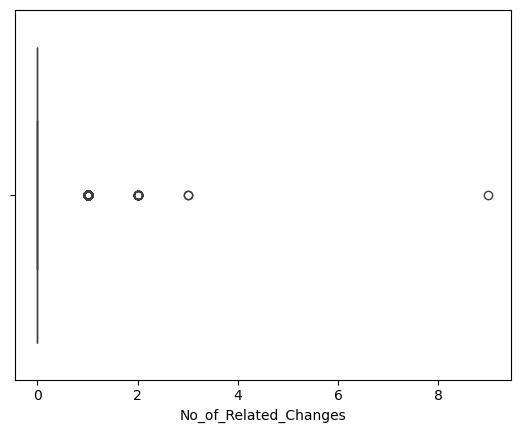

In [82]:
sns.boxplot(x=data.No_of_Related_Changes,orient='h')
plt.show()

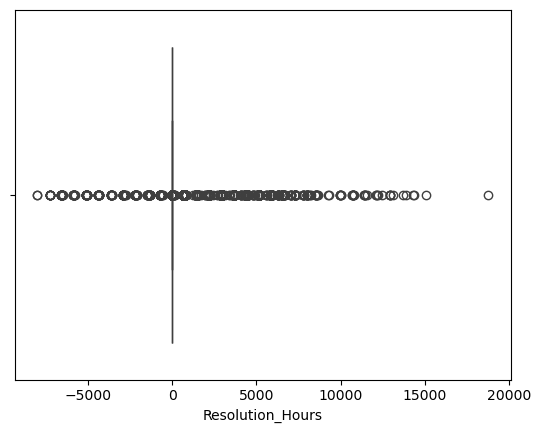

In [83]:
sns.boxplot(x=data.Resolution_Hours,orient='h')
plt.show()

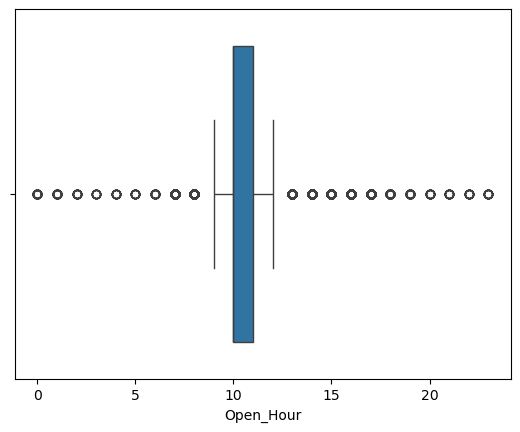

In [86]:
sns.boxplot(x=data.Open_Hour,orient='h')
plt.show()

In [89]:
from scipy.stats.mstats import winsorize
#Specify the percentage of data to be trimmed from both ends
trim_percentage = 0.05
#Winsorize the specified column
data['No_of_Reassignments']=winsorize(data['No_of_Reassignments'],limits=trim_percentage)

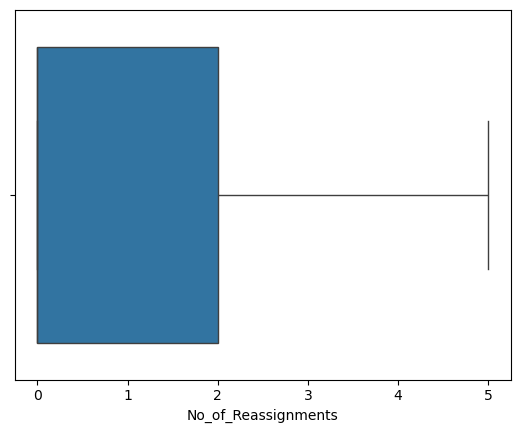

In [91]:
sns.boxplot(x=data.No_of_Reassignments,orient='h')
plt.show()

In [93]:
from scipy.stats.mstats import winsorize
#Specify the percentage of data to be trimmed from both ends
trim_percentage = 0.05
#Winsorize the specified column
data['No_of_Related_Incidents']=winsorize(data['No_of_Related_Incidents'],limits=trim_percentage)

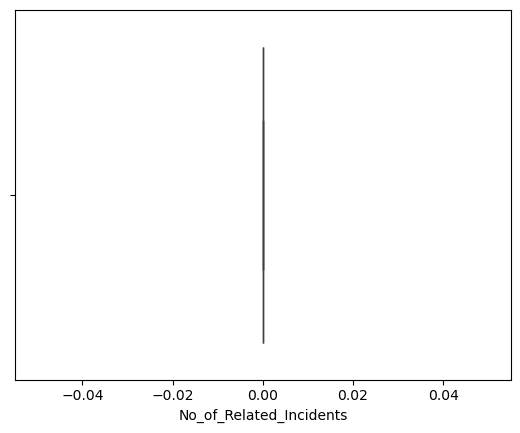

In [95]:
sns.boxplot(x=data.No_of_Related_Incidents,orient='h')
plt.show()

In [97]:
from scipy.stats.mstats import winsorize
#Specify the percentage of data to be trimmed from both ends
trim_percentage = 0.05
#Winsorize the specified column
data['Open_Hour']=winsorize(data['Open_Hour'],limits=trim_percentage)

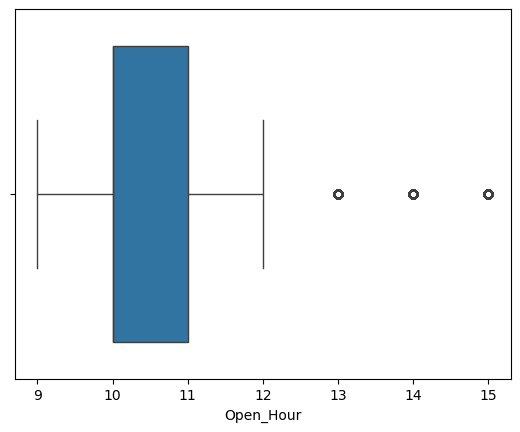

In [99]:
sns.boxplot(x=data.Open_Hour,orient='h')
plt.show()

In [101]:
from scipy.stats.mstats import winsorize
#Specify the percentage of data to be trimmed from both ends
trim_percentage = 0.05
#Winsorize the specified column
data['No_of_Related_Interactions']=winsorize(data['No_of_Related_Interactions'],limits=trim_percentage)

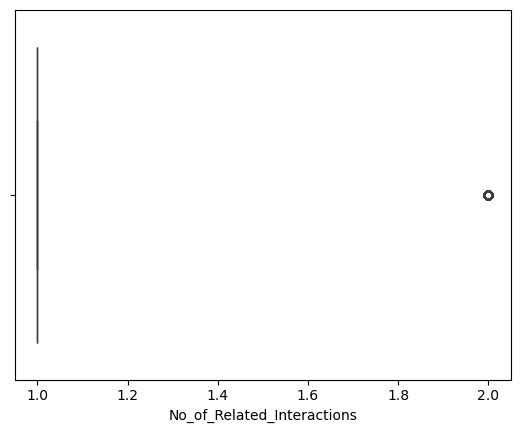

In [103]:
sns.boxplot(x=data.No_of_Related_Interactions,orient='h')
plt.show()

In [105]:
from scipy.stats.mstats import winsorize
#Specify the percentage of data to be trimmed from both ends
trim_percentage = 0.05
#Winsorize the specified column
data['Resolution_Hours']=winsorize(data['Resolution_Hours'],limits=trim_percentage)

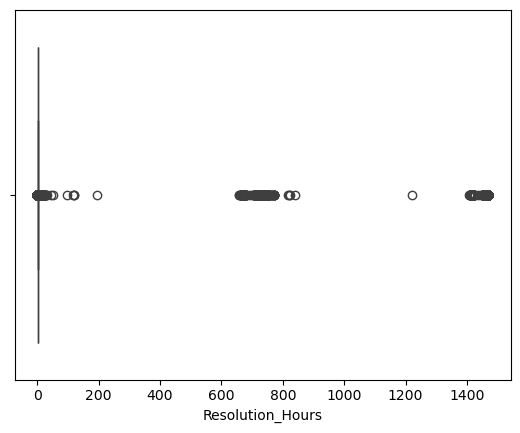

In [107]:
sns.boxplot(data.Resolution_Hours,orient='h')
plt.show()

### EDA

In [110]:
from ydata_profiling import ProfileReport

In [111]:
profile=ProfileReport(data,title="EDA",explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

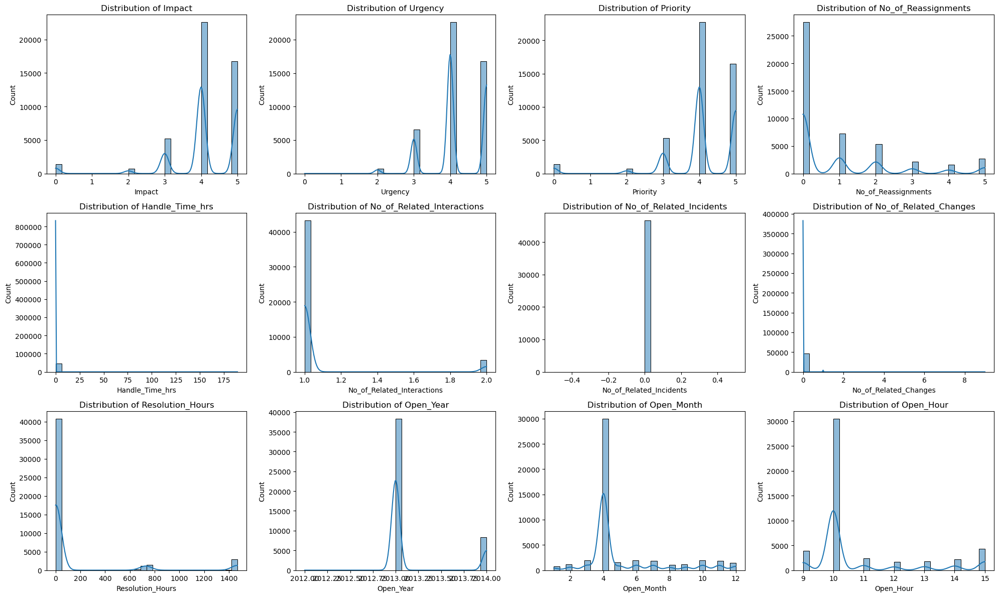

In [114]:
#Univariate analysis for numerical cols
import math
# Grid setup
cols = 4
rows = math.ceil(len(numerical_cols) / cols)
plt.figure(figsize=(20, rows * 4))
# Plot histograms
for i, column in enumerate(numerical_cols, 1):
    plt.subplot(rows, cols, i)
    sns.histplot(data[column], kde=True, bins=30)
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Count")
plt.tight_layout()
plt.show()

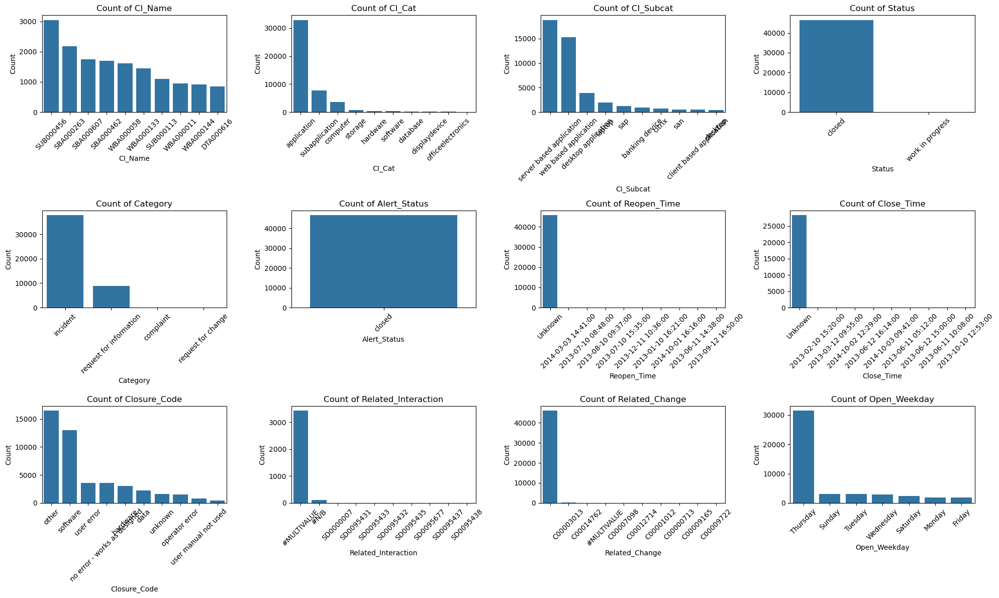

In [116]:
#Univariate analysis of categorical cols
cols = 4
rows = math.ceil(len(categorical_cols) / cols)
plt.figure(figsize=(20, rows * 4))
# Plot countplots
for i, column in enumerate(categorical_cols, 1):
    plt.subplot(rows, cols, i)
    sns.countplot(x=column, data=data, order=data[column].value_counts().index[:10])  # Top 10 only
    plt.title(f"Count of {column}")
    plt.xticks(rotation=45)
    plt.xlabel(column)
    plt.ylabel("Count")
plt.tight_layout()
plt.show()

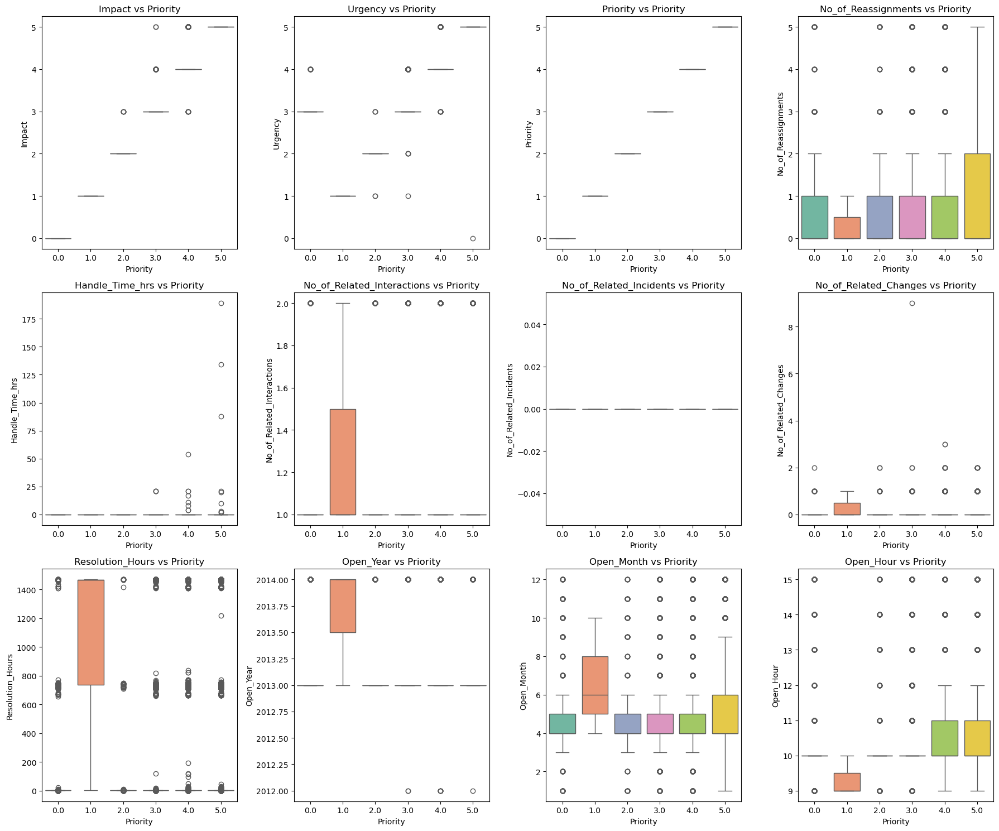

In [117]:
#Bivariate Analysis
#Analyzing numerical data with target
cols = 4
rows = math.ceil(len(numerical_cols) / cols)
plt.figure(figsize=(18, rows * 5))
# Plot each numerical feature against the target
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(rows, cols, i)
    sns.boxplot(x='Priority', y=col, data=data, palette="Set2")
    plt.title(f'{col} vs Priority')
    plt.xlabel('Priority')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

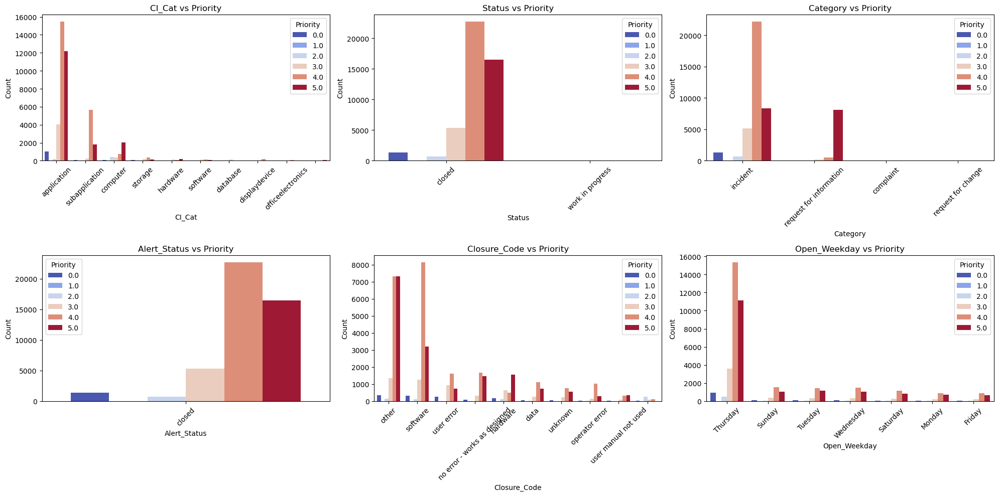

In [118]:
#Analyzing categorical data with target
#filtering out high-cardinality columns (too many unique values)
categorical_cols = [col for col in categorical_cols if data[col].nunique() <= 25]
cols = 3
rows = math.ceil(len(categorical_cols) / cols)
plt.figure(figsize=(20, rows * 5))
# Plot countplots with hue as Priority
for i, col in enumerate(categorical_cols, 1):
    plt.subplot(rows, cols, i)
    sns.countplot(data=data, x=col, hue='Priority', palette='coolwarm',
                  order=data[col].value_counts().index[:10])  # top 10 categories only
    plt.title(f'{col} vs Priority')
    plt.xticks(rotation=45)
    plt.xlabel(col)
    plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [122]:
data.columns

Index(['CI_Name', 'CI_Cat', 'CI_Subcat', 'Status', 'Impact', 'Urgency',
       'Priority', 'Category', 'Alert_Status', 'No_of_Reassignments',
       'Open_Time', 'Reopen_Time', 'Resolved_Time', 'Close_Time',
       'Handle_Time_hrs', 'Closure_Code', 'No_of_Related_Interactions',
       'Related_Interaction', 'No_of_Related_Incidents',
       'No_of_Related_Changes', 'Related_Change', 'Resolution_Hours',
       'Open_Year', 'Open_Month', 'Open_Weekday', 'Open_Hour'],
      dtype='object')

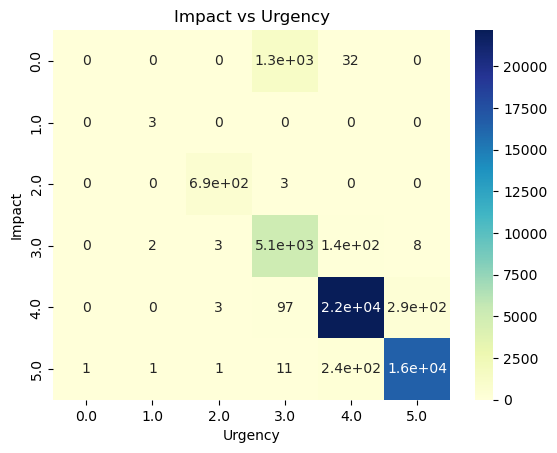

In [124]:
#Analyzing the relationship between the input attributes
# Heatmap for Impact vs Urgency
#Check if high-impact tickets are also marked as urgent.
ct = pd.crosstab(data['Impact'], data['Urgency'])
sns.heatmap(ct, annot=True, cmap="YlGnBu")
plt.title("Impact vs Urgency")
plt.show()

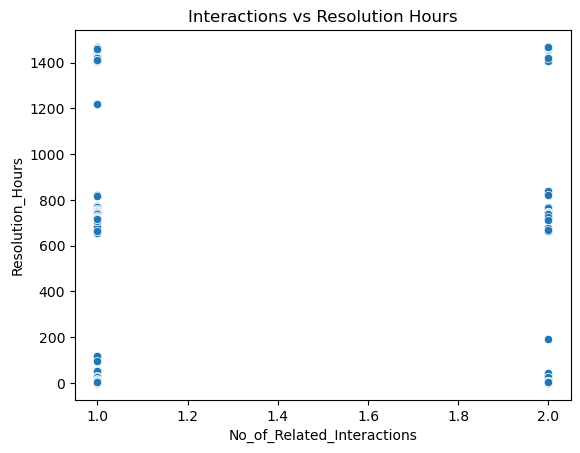

In [126]:
#Related_interactions vs categories
#Validate if subcategories are correctly grouped under categories.
sns.scatterplot(x='No_of_Related_Interactions', y='Resolution_Hours', data=data)
plt.title("Interactions vs Resolution Hours")
plt.show()

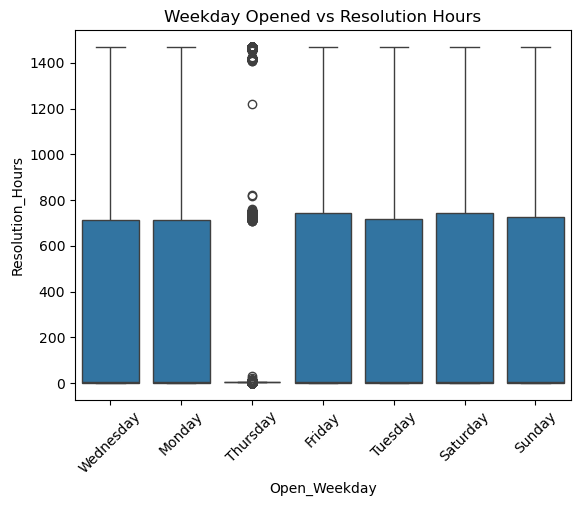

In [128]:
#open_weekday vs Resolution hours
#Identify delays based on day of week.
sns.boxplot(x='Open_Weekday', y='Resolution_Hours', data=data)
plt.title("Weekday Opened vs Resolution Hours")
plt.xticks(rotation=45)
plt.show()

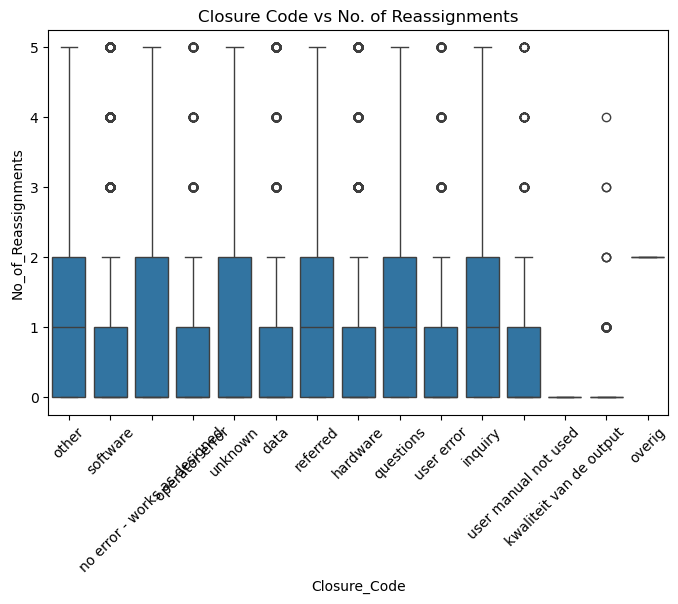

In [130]:
#Closure_Code vs No_of_Reassignments 
#Are some closure codes linked to excessive reassignments?
plt.figure(figsize=(8, 5))
sns.boxplot(x='Closure_Code', y='No_of_Reassignments', data=data)
plt.title("Closure Code vs No. of Reassignments")
plt.xticks(rotation=45)
plt.show()

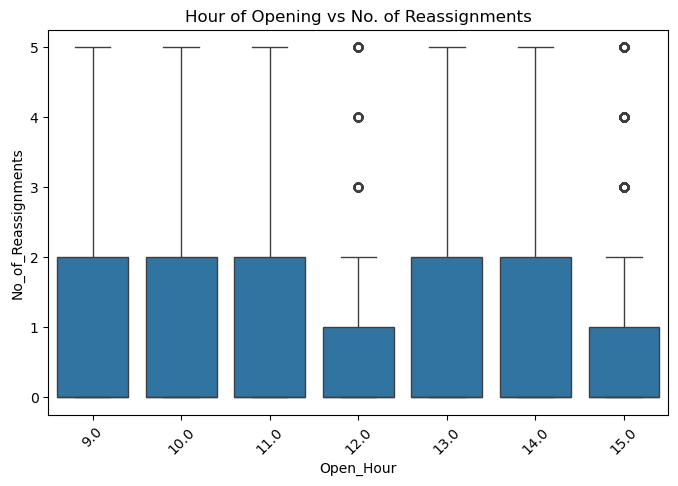

In [132]:
#Open_Hour vs No_of_Reassignments 
#Are tickets opened during certain hours more likely to be reassigned?
plt.figure(figsize=(8, 5))
sns.boxplot(x='Open_Hour', y='No_of_Reassignments', data=data)
plt.title("Hour of Opening vs No. of Reassignments")
plt.xticks(rotation=45)
plt.show()

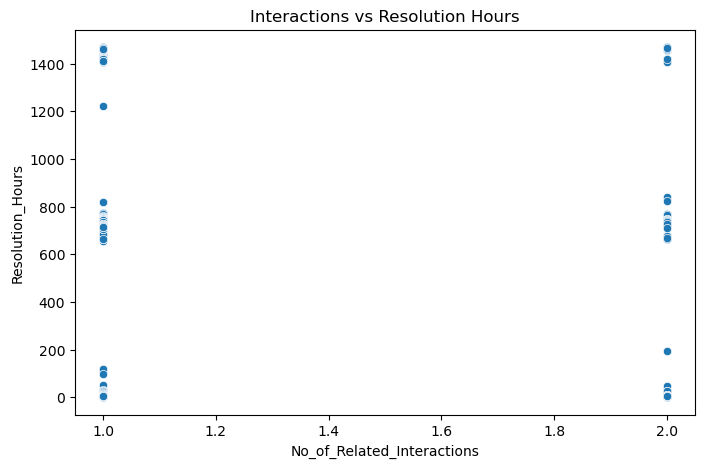

In [134]:
#No_of_Related_Interactions vs Resolution_Hours
#Do more interactions result in longer resolution times?
plt.figure(figsize=(8, 5))
sns.scatterplot(x='No_of_Related_Interactions', y='Resolution_Hours', data=data)
plt.title("Interactions vs Resolution Hours")
plt.show()

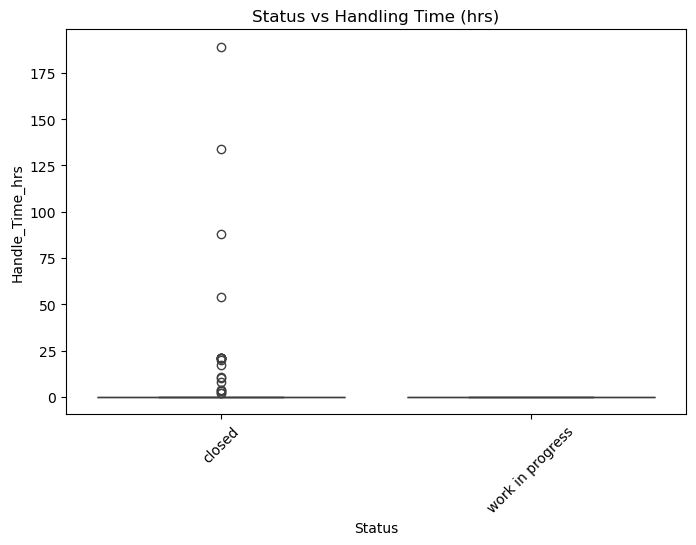

In [136]:
#Status vs Handle_Time_hrs 
#See how average handling time varies across statuses.
plt.figure(figsize=(8, 5))
sns.boxplot(x='Status', y='Handle_Time_hrs', data=data)
plt.title("Status vs Handling Time (hrs)")
plt.xticks(rotation=45)
plt.show()

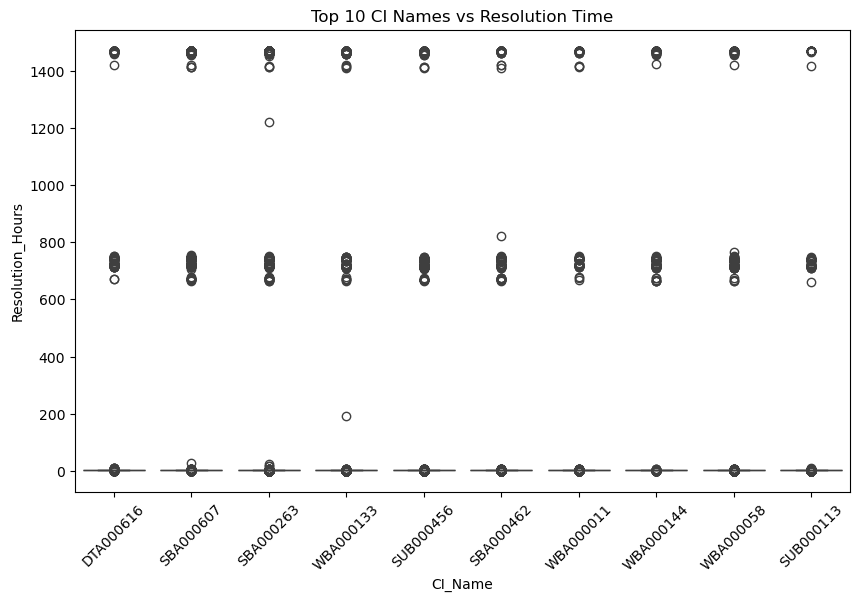

In [138]:
#CI_Name vs Resolution_Hours (Top 10 CI only)
#Identify services that tend to take longer to resolve.
top_cis = data['CI_Name'].value_counts().index[:10]
plt.figure(figsize=(10, 6))
sns.boxplot(x='CI_Name', y='Resolution_Hours', data=data[data['CI_Name'].isin(top_cis)])
plt.title("Top 10 CI Names vs Resolution Time")
plt.xticks(rotation=45)
plt.show()

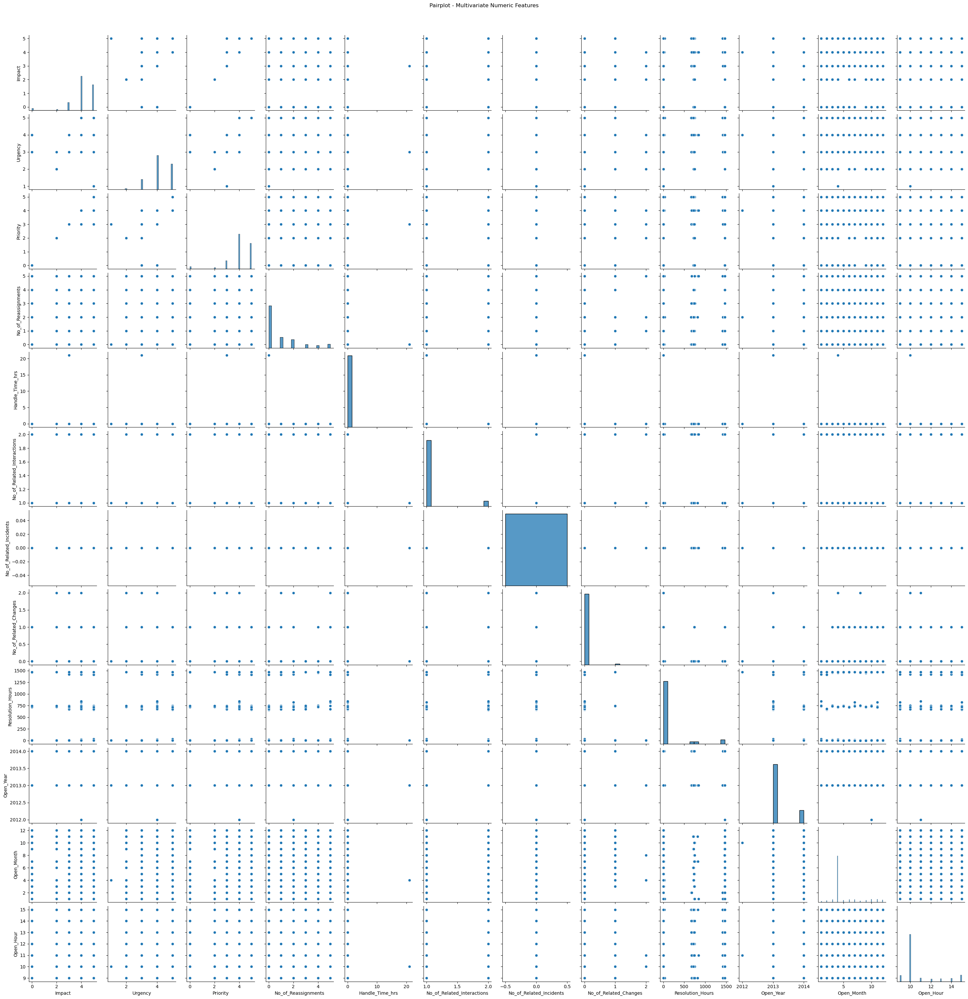

In [140]:
#Multivariate analysis
sample_data = data[numerical_cols].sample(5000, random_state=42) if len(data) > 5000 else data[numerical_cols]
sns.pairplot(sample_data)
plt.suptitle("Pairplot - Multivariate Numeric Features", y=1.02)
plt.show()

#### INSIGHTS FROM EDA 

### FEATURE ENGINEERING

In [143]:
data.No_of_Related_Incidents.value_counts()

No_of_Related_Incidents
0.0    46606
Name: count, dtype: int64

In [145]:
data.drop(columns=['No_of_Related_Incidents'], inplace=True)

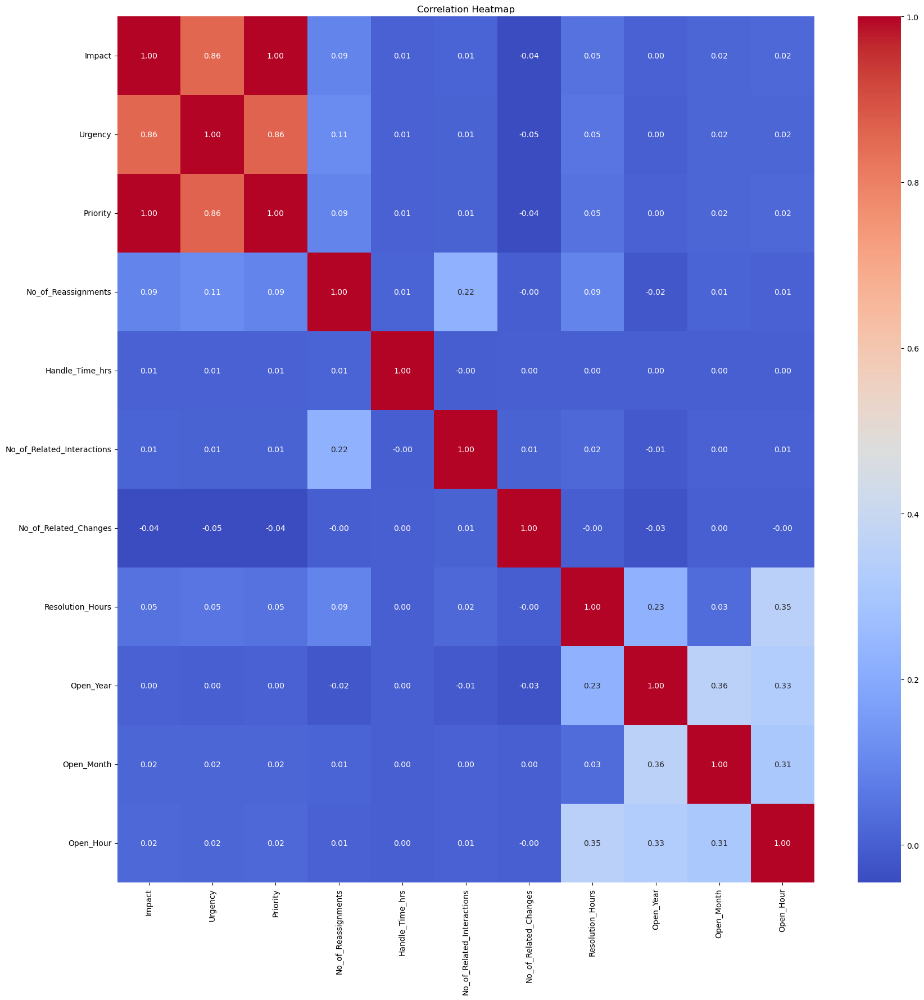

In [147]:
# Calculate the correlation matrix
numeric_data = data.select_dtypes(include=['number'])
corr_matrix = numeric_data.corr()
# Plot the heatmap
plt.figure(figsize=(20,20))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap")
plt.show()

In [148]:
#Find Correlations with the Target
target_corr = corr_matrix['Priority'].sort_values(ascending=False)
print("Correlations with target variable 'Priority':")
print(target_corr)

Correlations with target variable 'Priority':
Priority                      1.000000
Impact                        0.995996
Urgency                       0.862947
No_of_Reassignments           0.092712
Resolution_Hours              0.045446
Open_Hour                     0.021396
Open_Month                    0.016736
No_of_Related_Interactions    0.011335
Handle_Time_hrs               0.006145
Open_Year                     0.003723
No_of_Related_Changes        -0.042322
Name: Priority, dtype: float64


In [151]:
# Find pairs with correlation > 0.8
high_corr = corr_matrix.abs().unstack().sort_values(ascending=False)
high_corr = high_corr[high_corr >= 0.8]  # Threshold for strong correlation
print("Highly correlated feature pairs:")
print(high_corr)

Highly correlated feature pairs:
Impact                      Impact                        1.000000
Urgency                     Urgency                       1.000000
Open_Month                  Open_Month                    1.000000
Open_Year                   Open_Year                     1.000000
Resolution_Hours            Resolution_Hours              1.000000
No_of_Related_Changes       No_of_Related_Changes         1.000000
Handle_Time_hrs             Handle_Time_hrs               1.000000
No_of_Reassignments         No_of_Reassignments           1.000000
Priority                    Priority                      1.000000
No_of_Related_Interactions  No_of_Related_Interactions    1.000000
Open_Hour                   Open_Hour                     1.000000
Priority                    Impact                        0.995996
Impact                      Priority                      0.995996
Urgency                     Priority                      0.862947
Priority                    U

In [153]:
#The Impact column is removed because it is almost perfectly correlated with the target Priority 
#which can lead to data leakage and inflate model performance artificially.
data.drop(columns=['Impact'], inplace=True)

In [155]:
drop_cols = [
    'CI_Name',               # ID-like, High cardinality
    'Open_Time',             # Already covered by Open_Year, Month, Hour
    'Reopen_Time',           # Not processed into features
    'Resolved_Time',         # Used in Resolution_Hours
    'Close_Time',            # Not modeled
    'Related_Interaction',   # ID-like
    'Related_Change',        # ID-like
    'Alert_Status'
]
# Drop the columns from the DataFrame
data = data.drop(columns=drop_cols, axis=1)

In [157]:
data  #checking whether dropped or not 

,CI_Cat,CI_Subcat,Status,Urgency,Priority,Category,No_of_Reassignments,Handle_Time_hrs,Closure_Code,No_of_Related_Interactions,No_of_Related_Changes,Resolution_Hours,Open_Year,Open_Month,Open_Weekday,Open_Hour
0,subapplication,web based application,closed,4.0,4.0,incident,5.0,0.0,other,1.0,0.0,1469.233333,2012.0,5.0,Wednesday,13.0
1,application,web based application,closed,3.0,3.0,incident,5.0,0.0,software,1.0,0.0,1469.233333,2012.0,12.0,Monday,15.0
2,application,desktop application,closed,3.0,0.0,request for information,3.0,0.0,no error - works as designed,1.0,0.0,3.883333,2013.0,4.0,Thursday,10.0
3,application,web based application,closed,4.0,4.0,incident,5.0,0.0,operator error,1.0,0.0,3.883333,2013.0,4.0,Thursday,10.0
4,application,web based application,closed,4.0,4.0,incident,2.0,0.0,other,1.0,0.0,1469.233333,2012.0,10.0,Monday,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46601,application,server based application,closed,4.0,4.0,incident,0.0,0.0,other,1.0,0.0,3.883333,2013.0,4.0,Thursday,10.0
46602,application,server based application,closed,4.0,4.0,incident,0.0,0.0,user error,1.0,0.0,3.883333,2013.0,4.0,Thursday,10.0
46603,computer,laptop,closed,5.0,5.0,incident,0.0,0.0,hardware,1.0,0.0,3.883333,2013.0,4.0,Thursday,10.0
46604,application,web based application,closed,4.0,4.0,incident,0.0,0.0,software,1.0,0.0,3.883333,2013.0,4.0,Thursday,10.0


In [159]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler,LabelEncoder,OneHotEncoder,OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
import pickle
from sklearn.pipeline import Pipeline

In [160]:
data.columns

Index(['CI_Cat', 'CI_Subcat', 'Status', 'Urgency', 'Priority', 'Category',
       'No_of_Reassignments', 'Handle_Time_hrs', 'Closure_Code',
       'No_of_Related_Interactions', 'No_of_Related_Changes',
       'Resolution_Hours', 'Open_Year', 'Open_Month', 'Open_Weekday',
       'Open_Hour'],
      dtype='object')

In [163]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()

In [165]:
#The columns are given to the encoders and scalers accordingly
standard_scaler = ['Resolution_Hours']
minmax_scaler = ['No_of_Reassignments','Handle_Time_hrs','Open_Hour']
frequency_encoder = ['CI_Cat','CI_Subcat','Category','Closure_Code','Open_Weekday']
label_encoder = ['Status']
passthrough = ['Urgency','No_of_Related_Interactions','No_of_Related_Changes','Open_Year','Open_Month']

In [167]:
#code to do label encoding
class ModifiedLabelEncoder(LabelEncoder):
    def fit_transform(self, y, *args, **kwargs):
        return super().fit_transform(y).reshape(-1, 1)
    def transform(self, y, *args, **kwargs):
        return super().transform(y).reshape(-1, 1)

In [169]:
#code to do frequency encoding
from sklearn.base import BaseEstimator, TransformerMixin
class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
        self.mappings = {}
    def fit(self, X, y=None):
        # Store frequency encoding for each column
        for column in self.columns:
            value_counts = X[column].value_counts()
            sorted_values = sorted(value_counts.items(), key=lambda x: x[1])
            self.mappings[column] = {value: idx for idx, (value, _) in enumerate(sorted_values)}
        return self
    def transform(self, X):
        X_encoded = X.copy()
        for column in self.columns:
            X_encoded[column] = X_encoded[column].map(self.mappings[column])
        return X_encoded

In [171]:
def same(x):
    return x

In [173]:
no_trans=FunctionTransformer(same)

In [175]:
# Define the column transformer with all encoders and scalers
preprocessor = ColumnTransformer([
    ("Standard_scaler", StandardScaler(), standard_scaler), 
    ("MinMax_scaler", MinMaxScaler(), minmax_scaler),  
    ("Label_encoder", OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1), label_encoder),  
    ("Frequency_encoder", FrequencyEncoder(frequency_encoder), frequency_encoder),  
    ("Pass_through", 'passthrough', passthrough)  
])

In [177]:
# Fit and transform the data
transformed_data = preprocessor.fit_transform(data)
# Print transformed data
print("Transformed data shape:", transformed_data.shape)
print("Preview of transformed data:")
print(transformed_data[:5])

Transformed data shape: (46606, 15)
Preview of transformed data:
[[ 3.41531775e+00  1.00000000e+00  0.00000000e+00  6.66666667e-01
   0.00000000e+00  1.10000000e+01  6.20000000e+01  3.00000000e+00
   1.40000000e+01  3.00000000e+00  4.00000000e+00  1.00000000e+00
   0.00000000e+00  2.01200000e+03  5.00000000e+00]
 [ 3.41531775e+00  1.00000000e+00  0.00000000e+00  1.00000000e+00
   0.00000000e+00  1.20000000e+01  6.20000000e+01  3.00000000e+00
   1.30000000e+01  1.00000000e+00  3.00000000e+00  1.00000000e+00
   0.00000000e+00  2.01200000e+03  1.20000000e+01]
 [-3.55673837e-01  6.00000000e-01  0.00000000e+00  1.66666667e-01
   0.00000000e+00  1.20000000e+01  6.10000000e+01  2.00000000e+00
   1.10000000e+01  6.00000000e+00  3.00000000e+00  1.00000000e+00
   0.00000000e+00  2.01300000e+03  4.00000000e+00]
 [-3.55673837e-01  1.00000000e+00  0.00000000e+00  1.66666667e-01
   0.00000000e+00  1.20000000e+01  6.20000000e+01  3.00000000e+00
   7.00000000e+00  6.00000000e+00  4.00000000e+00  1.000

In [179]:
preprocessor

ColumnTransformer(transformers=[('Standard_scaler', StandardScaler(),
                                 ['Resolution_Hours']),
                                ('MinMax_scaler', MinMaxScaler(),
                                 ['No_of_Reassignments', 'Handle_Time_hrs',
                                  'Open_Hour']),
                                ('Label_encoder',
                                 OrdinalEncoder(handle_unknown='use_encoded_value',
                                                unknown_value=-1),
                                 ['Status']),
                                ('Frequency_encoder',
                                 FrequencyEncoder(columns=['CI_Cat',
                                                           'CI_Subcat',
                                                           'Category',
                                                           'Closure_Code',
                                                           'Open_Weekday']),
                                 ['CI_Cat', 'CI_Subcat', 'Category',
                                  'Closure_Code', 'Open_Weekday']),
                                ('Pass_through', 'passthrough',
                                 ['Urgency', 'No_of_Related_Interactions',
                                  'No_of_Related_Changes', 'Open_Year',
                                  'Open_Month'])])

In [181]:
# Fit and transform the data using the preprocessor
transformed_data = preprocessor.fit_transform(data)
# Print the transformed data
print(transformed_data)

[[ 3.41531775e+00  1.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   2.01200000e+03  5.00000000e+00]
 [ 3.41531775e+00  1.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   2.01200000e+03  1.20000000e+01]
 [-3.55673837e-01  6.00000000e-01  0.00000000e+00 ...  0.00000000e+00
   2.01300000e+03  4.00000000e+00]
 ...
 [-3.55673837e-01  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   2.01300000e+03  4.00000000e+00]
 [-3.55673837e-01  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   2.01300000e+03  4.00000000e+00]
 [-3.55673837e-01  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   2.01300000e+03  4.00000000e+00]]


In [183]:
for name, transformer, columns in preprocessor.transformers_:
    print(f"Transformer: {name}, Columns: {columns}")

Transformer: Standard_scaler, Columns: ['Resolution_Hours']
Transformer: MinMax_scaler, Columns: ['No_of_Reassignments', 'Handle_Time_hrs', 'Open_Hour']
Transformer: Label_encoder, Columns: ['Status']
Transformer: Frequency_encoder, Columns: ['CI_Cat', 'CI_Subcat', 'Category', 'Closure_Code', 'Open_Weekday']
Transformer: Pass_through, Columns: ['Urgency', 'No_of_Related_Interactions', 'No_of_Related_Changes', 'Open_Year', 'Open_Month']
Transformer: remainder, Columns: [4]


In [185]:
# Print a preview of the transformed data
print("Preview of transformed data:")
print(transformed_data[:5])  # Show first 5 rows
# Check data type of transformed_data
if isinstance(transformed_data, np.ndarray):
    print("Data is encoded: Transformed data is a NumPy array.")
else:
    print("Data is not properly encoded.")
# Verify specific transformations
for name, transformer, columns in preprocessor.transformers_:
    print(f"Transformer: {name}, Applied on Columns: {columns}")

Preview of transformed data:
[[ 3.41531775e+00  1.00000000e+00  0.00000000e+00  6.66666667e-01
   0.00000000e+00  1.10000000e+01  6.20000000e+01  3.00000000e+00
   1.40000000e+01  3.00000000e+00  4.00000000e+00  1.00000000e+00
   0.00000000e+00  2.01200000e+03  5.00000000e+00]
 [ 3.41531775e+00  1.00000000e+00  0.00000000e+00  1.00000000e+00
   0.00000000e+00  1.20000000e+01  6.20000000e+01  3.00000000e+00
   1.30000000e+01  1.00000000e+00  3.00000000e+00  1.00000000e+00
   0.00000000e+00  2.01200000e+03  1.20000000e+01]
 [-3.55673837e-01  6.00000000e-01  0.00000000e+00  1.66666667e-01
   0.00000000e+00  1.20000000e+01  6.10000000e+01  2.00000000e+00
   1.10000000e+01  6.00000000e+00  3.00000000e+00  1.00000000e+00
   0.00000000e+00  2.01300000e+03  4.00000000e+00]
 [-3.55673837e-01  1.00000000e+00  0.00000000e+00  1.66666667e-01
   0.00000000e+00  1.20000000e+01  6.20000000e+01  3.00000000e+00
   7.00000000e+00  6.00000000e+00  4.00000000e+00  1.00000000e+00
   0.00000000e+00  2.01300

### MODEL BUILDING 

#### Predicting High Priority Tickets

In [188]:
#Binary Classification task → Predicting if a ticket is High Priority (P1/P2) or not So creating a new target column.
data['High_Priority'] = data['Priority'].apply(lambda x: 1 if x in [1, 2] else 0)

In [190]:
# Final feature set
X = data.drop(['Priority', 'High_Priority'], axis=1)
y = data['High_Priority']

In [192]:
# Spliting the data into train and test
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=33)

In [194]:
# Transform the training data using the preprocessor object or PipeLine
processed_x_train = preprocessor.fit_transform(x_train)
processed_x_test = preprocessor.fit_transform(x_test)

In [196]:
y.value_counts(normalize=True)

High_Priority
0    0.98498
1    0.01502
Name: proportion, dtype: float64

In [198]:
#Balancing the data
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(processed_x_train, y_train)
print("Before SMOTE:", y_train.value_counts())
print("After SMOTE:", y_resampled.value_counts())

Before SMOTE: High_Priority
0    34426
1      528
Name: count, dtype: int64
After SMOTE: High_Priority
0    34426
1    34426
Name: count, dtype: int64


In [199]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

### 1.Logistic Regression 

In [202]:
# Define hyperparameter grid
log_param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],           
    'solver': ['liblinear', 'lbfgs']        
}

# Grid search with cross-validation
log_grid = GridSearchCV(
    LogisticRegression(random_state=42),
    log_param_grid,
    cv=3,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Fit on resampled (SMOTE) training data
log_grid.fit(X_resampled, y_resampled)
print("Best Parameters for Logistic Regression:", log_grid.best_params_)

# Train final model with best parameters
best_log_model = LogisticRegression(**log_grid.best_params_, random_state=42)
best_log_model.fit(X_resampled, y_resampled)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Parameters for Logistic Regression: {'C': 100, 'solver': 'liblinear'}


LogisticRegression(C=100, random_state=42, solver='liblinear')

In [204]:
y_predict = best_log_model.predict(processed_x_test)
y_predict

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

Logistic Regression Accuracy: 0.9613800205973223

 Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     11480
           1       0.28      1.00      0.43       172

    accuracy                           0.96     11652
   macro avg       0.64      0.98      0.71     11652
weighted avg       0.99      0.96      0.97     11652



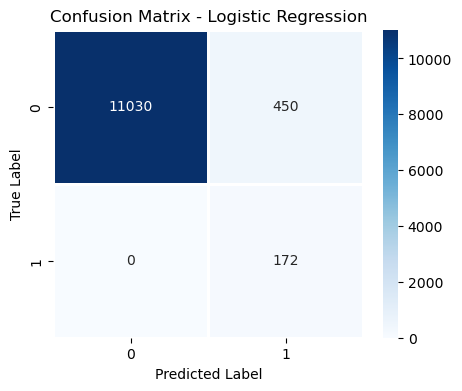

In [205]:
# Now, Evaluate Model Performance
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
# Calculate Accuracy
log_accuracy = accuracy_score(y_test, y_predict)
print("Logistic Regression Accuracy:", log_accuracy)
# Print Classification Report
print("\n Classification Report for Logistic Regression:")
print(classification_report(y_test, y_predict))
# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_predict), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

### 2.Decision Tree

In [207]:
# Define parameter grid
param_grid = {
    'max_depth': [5, 10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 3, 5]
}

# Grid Search with resampled (balanced) data
grid_search = GridSearchCV(
    DecisionTreeClassifier(random_state=42),
    param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=1
)

# Fit using SMOTE-balanced data
grid_search.fit(X_resampled, y_resampled)

# Best params
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Final model
best_dt_model = DecisionTreeClassifier(**best_params, random_state=42)
best_dt_model.fit(X_resampled, y_resampled)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best Parameters: {'max_depth': 5, 'min_samples_leaf': 5, 'min_samples_split': 2}


DecisionTreeClassifier(max_depth=5, min_samples_leaf=5, random_state=42)

In [208]:
# Predict
y_pred_dt = best_dt_model.predict(processed_x_test)
y_pred_dt

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

 Decision Tree Accuracy: 0.9999141778235496

 Classification Report for Decision Tree:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11480
           1       0.99      1.00      1.00       172

    accuracy                           1.00     11652
   macro avg       1.00      1.00      1.00     11652
weighted avg       1.00      1.00      1.00     11652



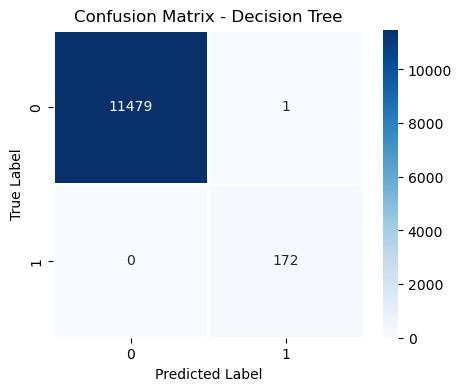

In [209]:
# Evaluate Decision Tree
dt_accuracy = accuracy_score(y_test, y_pred_dt)
print(" Decision Tree Accuracy:", dt_accuracy)
print("\n Classification Report for Decision Tree:")
print(classification_report(y_test, y_pred_dt))
# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_dt), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Decision Tree")
plt.show()

### 3.Random Forest 

In [211]:
# Define Hyperparameters for Random Forest
rf_param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Train Random Forest with GridSearchCV
rf_grid = GridSearchCV(
    RandomForestClassifier(random_state=42),
    rf_param_grid,
    cv=3,
    scoring='f1_weighted',  # Better for imbalance
    n_jobs=-1,
    verbose=2
)

# Fit on SMOTE-balanced data
rf_grid.fit(X_resampled, y_resampled)

# Best parameters
print("Best Parameters for Random Forest:", rf_grid.best_params_)
# Train final Random Forest with best parameters
best_rf_model = RandomForestClassifier(**rf_grid.best_params_, random_state=42)
best_rf_model.fit(X_resampled, y_resampled)

Fitting 3 folds for each of 54 candidates, totalling 162 fits
Best Parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


RandomForestClassifier(random_state=42)

In [212]:
# Predict
y_pred_rf = best_rf_model.predict(processed_x_test)
y_pred_rf

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

 Random Forest Accuracy: 0.9999141778235496

 Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11480
           1       0.99      1.00      1.00       172

    accuracy                           1.00     11652
   macro avg       1.00      1.00      1.00     11652
weighted avg       1.00      1.00      1.00     11652



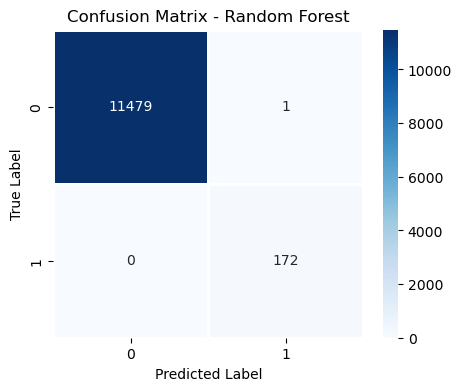

In [213]:
# Evaluate Random Forest
rf_accuracy = accuracy_score(y_test, y_pred_rf)
print(" Random Forest Accuracy:", rf_accuracy)
print("\n Classification Report for Random Forest:")
print(classification_report(y_test, y_pred_rf))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Random Forest")
plt.show()

### 4.Gradient Boosting

In [215]:
# Define Hyperparameters for Gradient Boosting
gb_param_grid = {
    'n_estimators': [50, 100],
    'learning_rate': [0.01, 0.1]
}

# GridSearchCV for Gradient Boosting
gb_grid = GridSearchCV(
    GradientBoostingClassifier(random_state=42),
    gb_param_grid,
    cv=3,
    scoring='f1_weighted',  # better metric for imbalanced/balanced binary class
    n_jobs=-1,
    verbose=2
)

# Fit on SMOTE-balanced training data
gb_grid.fit(X_resampled, y_resampled)

# Display best hyperparameters
print("Best Parameters for Gradient Boosting:", gb_grid.best_params_)

# Train final Gradient Boosting model with best params
best_gb_model = GradientBoostingClassifier(**gb_grid.best_params_, random_state=42)
best_gb_model.fit(X_resampled, y_resampled)

Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best Parameters for Gradient Boosting: {'learning_rate': 0.01, 'n_estimators': 50}


GradientBoostingClassifier(learning_rate=0.01, n_estimators=50, random_state=42)

In [216]:
# Predict
y_pred_gb = best_gb_model.predict(processed_x_test)
y_pred_gb

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

 Gradient Boosting Accuracy: 0.9999141778235496

 Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11480
           1       0.99      1.00      1.00       172

    accuracy                           1.00     11652
   macro avg       1.00      1.00      1.00     11652
weighted avg       1.00      1.00      1.00     11652



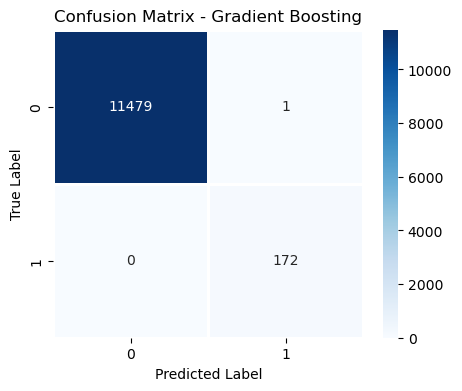

In [217]:
# Evaluate Gradient Boosting
gb_accuracy = accuracy_score(y_test, y_pred_gb)
print(" Gradient Boosting Accuracy:", gb_accuracy)
print("\n Classification Report for Gradient Boosting:")
print(classification_report(y_test, y_pred_gb))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_gb), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

##### 5.XGBoost

In [219]:
from xgboost import XGBClassifier
# Define parameter grid for XGBoost
xgb_param_grid = {
    'n_estimators': [50, 100],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5, 7]
}

# Grid search setup
xgb_grid = GridSearchCV(
    XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    xgb_param_grid,
    cv=3,
    scoring='f1_weighted',
    n_jobs=-1,
    verbose=2
)

# Fit on SMOTE-balanced training data
xgb_grid.fit(X_resampled, y_resampled)

# Best hyperparameters
print("Best Parameters for XGBoost:", xgb_grid.best_params_)

# Train final model with best parameters
best_xgb_model = XGBClassifier(**xgb_grid.best_params_, use_label_encoder=False, eval_metric='logloss', random_state=42)
best_xgb_model.fit(X_resampled, y_resampled)

Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best Parameters for XGBoost: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50}


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, ...)

In [221]:
# Predict on test set 
y_pred_xgb_tuned = best_xgb_model.predict(processed_x_test)
y_pred_xgb_tuned

array([0, 0, 0, ..., 0, 0, 0])

 Gradient Boosting Accuracy: 0.9999141778235496

 Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11480
           1       0.99      1.00      1.00       172

    accuracy                           1.00     11652
   macro avg       1.00      1.00      1.00     11652
weighted avg       1.00      1.00      1.00     11652



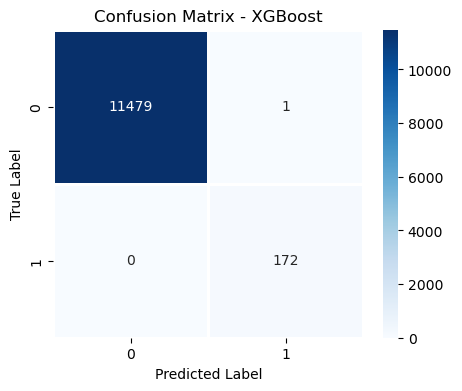

In [223]:
# Evaluate Gradient Boosting
xgb_accuracy = accuracy_score(y_test, y_pred_xgb_tuned)
print(" Gradient Boosting Accuracy:", xgb_accuracy)
print("\n Classification Report for Gradient Boosting:")
print(classification_report(y_test, y_pred_xgb_tuned))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_xgb_tuned), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - XGBoost")
plt.show()

### MODEL COMPARISION REPORT


📊 Model Performance Comparison:
Decision Tree: 0.9999
Random Forest: 0.9999
Gradient Boosting: 0.9999
XGBoost: 0.9999
Logistic Regression: 0.9614


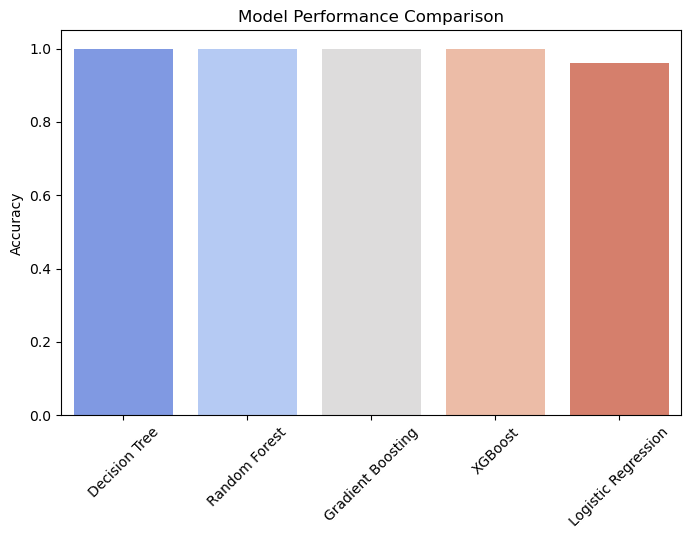

In [226]:
# Store model results
model_results = {
    "Logistic Regression": log_accuracy,
    "Decision Tree": dt_accuracy,
    "Random Forest": rf_accuracy,
    "Gradient Boosting": gb_accuracy,
    "XGBoost": xgb_accuracy
}

# Sort models by accuracy
sorted_results = sorted(model_results.items(), key=lambda x: x[1], reverse=True)
print("\n📊 Model Performance Comparison:")
for model, acc in sorted_results:
    print(f"{model}: {acc:.4f}")

# Plot Model Comparison
plt.figure(figsize=(8, 5))
sns.barplot(x=[m[0] for m in sorted_results], y=[m[1] for m in sorted_results], palette="coolwarm")
plt.xticks(rotation=45)
plt.ylabel("Accuracy")
plt.title("Model Performance Comparison")
plt.show()

### FEATURE IMPORTANCE ANALYSIS

In [240]:
# Extract feature importances from trained models
lr_feature_importance = abs(best_log_model.coef_[0])  #Logistic Regression
df_feature_importance = best_dt_model.feature_importances_  #Decision Tree
rf_feature_importance = best_rf_model.feature_importances_  # Random Forest
xgb_feature_importance = best_xgb_model.feature_importances_  # XGBoost
gb_feature_importance = best_gb_model.feature_importances_  # Gradient Boosting

# Verify extracted importance arrays
print("Logistic Regression Feature Importance Shape:", lr_feature_importance.shape)
print("Decision Tree Feature Importance Shape:", df_feature_importance.shape)
print("RandomForest Feature Importance Shape:", rf_feature_importance.shape)
print("XGBoost Feature Importance Shape:", xgb_feature_importance.shape)
print("GradientBoosting Feature Importance Shape:", gb_feature_importance.shape)

Logistic Regression Feature Importance Shape: (15,)
Decision Tree Feature Importance Shape: (15,)
RandomForest Feature Importance Shape: (15,)
XGBoost Feature Importance Shape: (15,)
GradientBoosting Feature Importance Shape: (15,)


In [242]:
# Extract feature names from the preprocessor
feature_names = []
for name, transformer, columns in preprocessor.transformers_:
    if hasattr(transformer, 'get_feature_names_out'):
        feature_names.extend(transformer.get_feature_names_out(columns))
    else:
        feature_names.extend(columns)  # Use original column names for passthrough

# Convert to NumPy array for consistency
feature_names = np.array(feature_names)

# Ensure feature names match processed_x_train (only first 19 features)
feature_names = feature_names[:processed_x_train.shape[1]]
print("Feature Names:", feature_names)
print("Number of Features:", len(feature_names))

Feature Names: ['Resolution_Hours' 'No_of_Reassignments' 'Handle_Time_hrs' 'Open_Hour'
 'Status' 'CI_Cat' 'CI_Subcat' 'Category' 'Closure_Code' 'Open_Weekday'
 'Urgency' 'No_of_Related_Interactions' 'No_of_Related_Changes'
 'Open_Year' 'Open_Month']
Number of Features: 15


In [244]:
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,  
    'LogisticRegression': lr_feature_importance,
    'DecisionTree' : df_feature_importance,
    'RandomForest': rf_feature_importance,
    'XGBoost': xgb_feature_importance,
    'GradientBoosting': gb_feature_importance
})

# Compute mean importance across models
feature_importance_df['MeanImportance'] = feature_importance_df[['LogisticRegression','DecisionTree','RandomForest', 'XGBoost', 'GradientBoosting']].mean(axis=1)

# Sort features by mean importance
feature_importance_df = feature_importance_df.sort_values(by="MeanImportance", ascending=False)

# Display top 5 most important features
print("Top Important Features:\n", feature_importance_df.head(10))

Top Important Features:
                        Feature  LogisticRegression  DecisionTree  \
10                     Urgency           17.912063  9.999452e-01   
7                     Category            5.391291  0.000000e+00   
1          No_of_Reassignments            5.293915  2.518463e-06   
11  No_of_Related_Interactions            3.672693  1.126820e-05   
0             Resolution_Hours            1.018547  4.873441e-07   
12       No_of_Related_Changes            0.999039  1.347888e-07   
9                 Open_Weekday            0.582630  3.568711e-05   
3                    Open_Hour            0.519273  0.000000e+00   
8                 Closure_Code            0.398454  3.044680e-08   
5                       CI_Cat            0.242410  3.597816e-07   

    RandomForest  XGBoost  GradientBoosting  MeanImportance  
10      0.649994      1.0      9.999965e-01        4.312400  
7       0.019281      0.0      0.000000e+00        1.082114  
1       0.030500      0.0      1.373763e

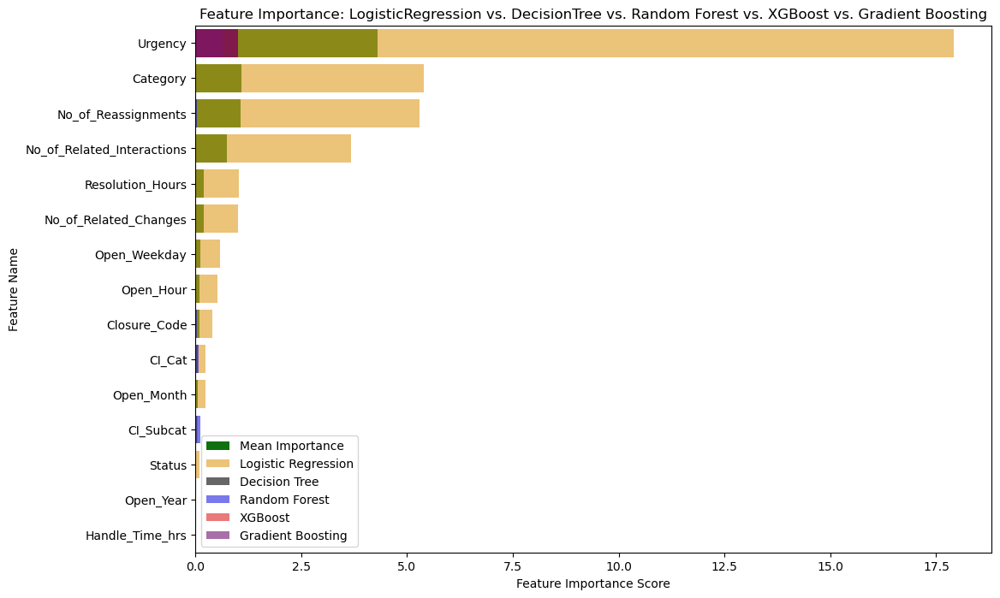

In [246]:
# Plot feature importance using Seaborn
plt.figure(figsize=(12, 8))
sns.barplot(x="MeanImportance", y="Feature", data=feature_importance_df, color='green', label="Mean Importance")
sns.barplot(x="LogisticRegression", y="Feature", data=feature_importance_df, color='orange', alpha=0.6, label="Logistic Regression")
sns.barplot(x="DecisionTree", y="Feature", data=feature_importance_df, color='black', alpha=0.6, label="Decision Tree")
sns.barplot(x="RandomForest", y="Feature", data=feature_importance_df, color='blue', alpha=0.6, label="Random Forest")
sns.barplot(x="XGBoost", y="Feature", data=feature_importance_df, color='red', alpha=0.6, label="XGBoost")
sns.barplot(x="GradientBoosting", y="Feature", data=feature_importance_df, color='purple', alpha=0.6, label="Gradient Boosting")

plt.xlabel("Feature Importance Score")
plt.ylabel("Feature Name")
plt.title("Feature Importance: LogisticRegression vs. DecisionTree vs. Random Forest vs. XGBoost vs. Gradient Boosting")
plt.legend()
plt.show()

#### Summary Of predicting High priority Tickets

#### Forecasting Incident Volume

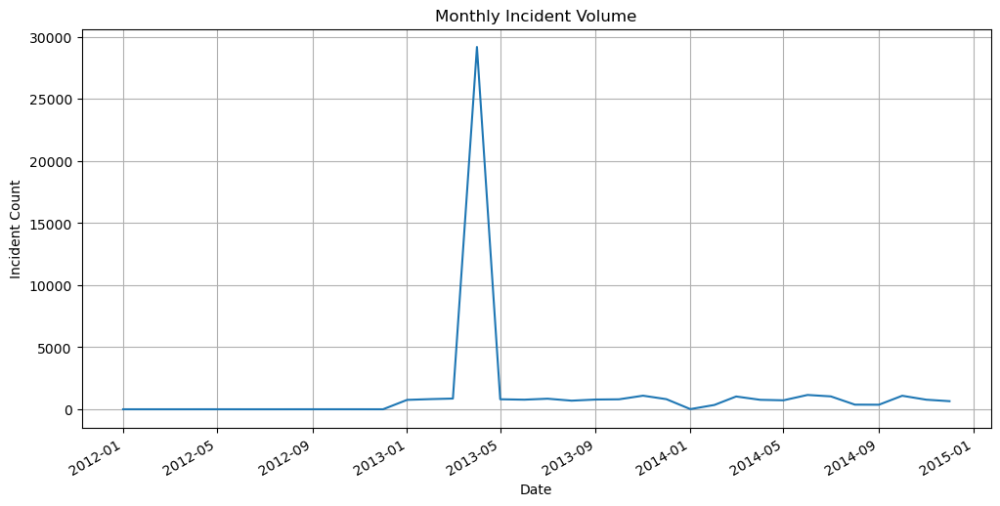

In [249]:
# Group by year and month
monthly_volume = data.groupby(['Open_Year', 'Open_Month']).size().reset_index(name='incident_count')

# Combine year and month into datetime
monthly_volume['date'] = pd.to_datetime(monthly_volume['Open_Year'].astype(int).astype(str) + '-' + monthly_volume['Open_Month'].astype(int).astype(str))

# Set as index and sort
monthly_volume = monthly_volume.sort_values('date').set_index('date')

# View the time series
import matplotlib.pyplot as plt
monthly_volume['incident_count'].plot(figsize=(12,6), title='Monthly Incident Volume')
plt.grid(True)
plt.xlabel("Date")
plt.ylabel("Incident Count")
plt.show()

In [251]:
from statsmodels.tsa.arima.model import ARIMA

# Use incident_count for forecasting
ts = monthly_volume['incident_count']

# Fit model
model = ARIMA(ts, order=(1,1,1))  # You can tune this later
model_fit = model.fit()

C:\Users\Windows\anaconda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Windows\anaconda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Windows\anaconda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [253]:
# Install if not already done
!pip install pmdarima

from pmdarima import auto_arima

# Auto tune ARIMA order
auto_model = auto_arima(ts, seasonal=False, stepwise=True, suppress_warnings=True, trace=True)

# Summary of selected model
print(auto_model.summary())

# Refit on full data using best order
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(ts, order=auto_model.order)
model_fit = model.fit()

# Forecast next 6 months
forecast = model_fit.forecast(steps=6)

# Display forecast
print(forecast)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=621.487, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=623.354, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=623.638, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=620.872, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=622.883, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=623.136, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=625.096, Time=0.04 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.435 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:                        SARIMAX   Log Likelihood                -308.436
Date:                Tue, 29 Apr 2025   AIC                       

C:\Users\Windows\anaconda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Windows\anaconda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Windows\anaconda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Windows\anaconda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


C:\Users\Windows\anaconda\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


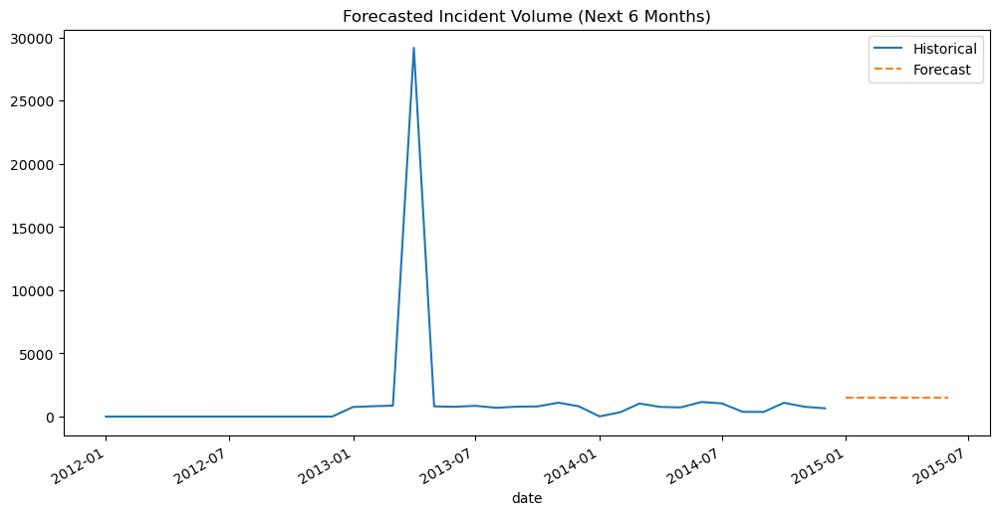

In [254]:
forecast = model_fit.forecast(steps=6)
# Plot original + forecast
ts.plot(label='Historical', figsize=(12,6))
forecast.index = pd.date_range(start=ts.index[-1] + pd.offsets.MonthBegin(1), periods=6, freq='MS')
forecast.plot(label='Forecast', style='--')
plt.title("Forecasted Incident Volume (Next 6 Months)")
plt.legend()
plt.show()

In [255]:
# Create a DataFrame for forecasted values
forecast_table = pd.DataFrame({
    'Month': forecast.index,
    'Forecasted_Incident_Count': forecast.values
})

# Reset index for better readability
forecast_table.reset_index(drop=True, inplace=True)

# Display the forecast table
print(forecast_table)

       Month  Forecasted_Incident_Count
0 2015-01-01                1503.546735
1 2015-02-01                1503.546735
2 2015-03-01                1503.546735
3 2015-04-01                1503.546735
4 2015-05-01                1503.546735
5 2015-06-01                1503.546735


#### Report Summary for Forecasting Incident Volume 

#### Auto-Tagging Tickets 

In [261]:
from sklearn.model_selection import train_test_split

# Auto-tag Priority (multi-class)
X_priority = data.drop(['Priority', 'High_Priority', 'Open_Time', 'Reopen_Time', 
                        'Resolved_Time', 'Close_Time'], axis=1, errors='ignore')
y_priority = data['Priority']

# Split data
X_train_p, X_test_p, y_train_p, y_test_p = train_test_split(X_priority, y_priority, 
                                                            test_size=0.25, random_state=42)

In [263]:
# Transform with the same preprocessor pipeline used earlier
X_train_p_trans = preprocessor.fit_transform(X_train_p)
X_test_p_trans = preprocessor.transform(X_test_p)

In [265]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

priority_model = RandomForestClassifier(random_state=42, class_weight='balanced')
priority_model.fit(X_train_p_trans, y_train_p)

# Predict and evaluate
y_pred_p = priority_model.predict(X_test_p_trans)
print("Classification Report for Priority Auto-Tagging:\n")
print(classification_report(y_test_p, y_pred_p))

Classification Report for Priority Auto-Tagging:

              precision    recall  f1-score   support

         0.0       0.19      0.20      0.20       338
         2.0       0.97      0.99      0.98       171
         3.0       0.80      0.76      0.78      1358
         4.0       0.99      0.99      0.99      5683
         5.0       0.98      1.00      0.99      4102

    accuracy                           0.94     11652
   macro avg       0.79      0.79      0.79     11652
weighted avg       0.94      0.94      0.94     11652



#### Autotagging for Departments

In [267]:
# X = input features (drop irrelevant that exist)
X_dept = data.drop(['Closure_Code', 'Priority', 'High_Priority'], axis=1)
# y = target (Closure_Code represents department)
y_dept = data['Closure_Code']

In [268]:
# Find classes with at least 2 samples
valid_classes = y_dept.value_counts()
valid_classes = valid_classes[valid_classes >= 2].index

# Filter X and y
X_dept_filtered = X_dept[y_dept.isin(valid_classes)]
y_dept_filtered = y_dept[y_dept.isin(valid_classes)]

# Now split safely with stratify
from sklearn.model_selection import train_test_split

X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(
    X_dept_filtered, y_dept_filtered, 
    test_size=0.25, random_state=42, stratify=y_dept_filtered
)

In [269]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Identify column types
numeric_features = ['Urgency', 'No_of_Reassignments', 'Handle_Time_hrs',
                    'No_of_Related_Interactions', 'No_of_Related_Changes',
                    'Resolution_Hours', 'Open_Year', 'Open_Month', 'Open_Hour']

categorical_features = ['CI_Cat', 'CI_Subcat', 'Status', 'Category', 'Open_Weekday']

# Pipelines
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Full preprocessing
preprocessor_dept = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [270]:
#Random forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

# Build full model pipeline
model_dept = Pipeline(steps=[
    ('preprocessor', preprocessor_dept),
    ('classifier', RandomForestClassifier(class_weight='balanced', random_state=42))
])

# Train the model
model_dept.fit(X_train_d, y_train_d)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Urgency',
                                                   'No_of_Reassignments',
                                                   'Handle_Time_hrs',
                                                   'No_of_Related_Interactions',
                                                   'No_of_Related_Changes',
                                                   'Resolution_Hours',
                                                   'Open_Year', 'Open_Month',
                                                   'Open_Hour']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['CI_Cat', 'CI_Subcat',
                                                   'Status', 'Category',
                                                   'Open_Weekday'])])),
                ('classifier',
                 RandomForestClassifier(class_weight='balanced',
                                        random_state=42))])

In [271]:
from sklearn.preprocessing import OrdinalEncoder

# Identify categorical columns
categorical_cols_d = X_train_d.select_dtypes(include='object').columns.tolist()

# Apply Ordinal Encoding
encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
X_train_d[categorical_cols_d] = encoder.fit_transform(X_train_d[categorical_cols_d])
X_test_d[categorical_cols_d] = encoder.transform(X_test_d[categorical_cols_d])

In [276]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Reduced parameter grid
rf_param_grid = {
    'n_estimators': [100, 200],       # fewer values
    'max_depth': [10, 20],             # no 'None'
    'min_samples_split': [2, 5],       # fewer options
    'min_samples_leaf': [1, 2],        # fewer options
    'max_features': ['sqrt']           # only 'sqrt' to reduce complexity
}

# Setup GridSearchCV
rf_grid = GridSearchCV(
    RandomForestClassifier(class_weight='balanced', random_state=42),
    param_grid=rf_param_grid,
    cv=3,
    scoring='f1_weighted', 
    n_jobs=-1,
    verbose=2
)

# Fit on training data
rf_grid.fit(X_train_d, y_train_d)

# Best parameters
print("Best Parameters for Random Forest:", rf_grid.best_params_)

# Train the best model
best_rf_model = RandomForestClassifier(**rf_grid.best_params_, class_weight='balanced', random_state=42)
best_rf_model.fit(X_train_d, y_train_d)

# Predictions
y_pred_rf = best_rf_model.predict(X_test_d)

# Evaluation
from sklearn.metrics import classification_report, accuracy_score

print("Random Forest Accuracy:", accuracy_score(y_test_d, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_test_d, y_pred_rf))

Fitting 3 folds for each of 16 candidates, totalling 48 fits
Best Parameters for Random Forest: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Random Forest Accuracy: 0.34277377274287674

Classification Report:
                               precision    recall  f1-score   support

                                   0.71      0.99      0.83       115
                        data       0.30      0.29      0.29       552
                    hardware       0.51      0.72      0.60       750
                     inquiry       0.09      0.45      0.14        40
     kwaliteit van de output       1.00      1.00      1.00         2
no error - works as designed       0.21      0.11      0.14       883
              operator error       0.12      0.26      0.16       385
                       other       0.57      0.33      0.41      4118
                   questions       0.01      0.24      0.02        33
                    refe

#### Auto Tagging Summary

#### Request for Change (RFC)

In [282]:
#Identify the columns
# Binary target for RFC presence
data['RFC_Flag'] = data['No_of_Related_Changes'].apply(lambda x: 1 if x > 0 else 0)

In [284]:
#Prepare Features and Target
X_rfc = data.drop(['Priority', 'High_Priority', 'RFC_Flag'], axis=1)
y_rfc = data['RFC_Flag']

In [286]:
#Train/Test Split
from sklearn.model_selection import train_test_split

X_train_rfc, X_test_rfc, y_train_rfc, y_test_rfc = train_test_split(X_rfc, y_rfc, 
                                                                     test_size=0.25, 
                                                                     random_state=42,
                                                                     stratify=y_rfc)

In [288]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Separate feature types
numeric_cols = ['Urgency', 'No_of_Reassignments', 'Handle_Time_hrs', 'No_of_Related_Interactions',
                'No_of_Related_Changes', 'Resolution_Hours', 'Open_Year', 'Open_Month', 'Open_Hour']
categorical_cols = ['CI_Cat', 'CI_Subcat', 'Status', 'Category', 'Closure_Code', 'Open_Weekday']

# Pipelines
numeric_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore'))
])

# Combine
preprocessor = ColumnTransformer([
    ('num', numeric_pipeline, numeric_cols),
    ('cat', categorical_pipeline, categorical_cols)
])

In [290]:
#Preprocessor pipeline
X_train_rfc_trans = preprocessor.fit_transform(X_train_rfc)
X_test_rfc_trans = preprocessor.transform(X_test_rfc)

In [291]:
#Balancing the Training Set 
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_train_rfc_bal, y_train_rfc_bal = smote.fit_resample(X_train_rfc_trans, y_train_rfc)

In [294]:
#Train model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

model_rfc = LogisticRegression(class_weight='balanced', random_state=42)
model_rfc.fit(X_train_rfc_bal, y_train_rfc_bal)

# Predict & Evaluate
y_pred_rfc = model_rfc.predict(X_test_rfc_trans)
print("Accuracy:", accuracy_score(y_test_rfc, y_pred_rfc))
print(classification_report(y_test_rfc, y_pred_rfc))

Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11512
           1       1.00      1.00      1.00       140

    accuracy                           1.00     11652
   macro avg       1.00      1.00      1.00     11652
weighted avg       1.00      1.00      1.00     11652



In [296]:
#Random forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(class_weight='balanced', random_state=42)
rf.fit(X_train_rfc_bal, y_train_rfc_bal)
y_pred_rf = rf.predict(X_test_rfc_trans)

print("RF Accuracy:", accuracy_score(y_test_rfc, y_pred_rf))
print(classification_report(y_test_rfc, y_pred_rf))

RF Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11512
           1       1.00      1.00      1.00       140

    accuracy                           1.00     11652
   macro avg       1.00      1.00      1.00     11652
weighted avg       1.00      1.00      1.00     11652



In [297]:
#XGBoost
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(class_weight='balanced', random_state=42)
rf.fit(X_train_rfc_bal, y_train_rfc_bal)
y_pred_rf = rf.predict(X_test_rfc_trans)

print("RF Accuracy:", accuracy_score(y_test_rfc, y_pred_rf))
print(classification_report(y_test_rfc, y_pred_rf))

RF Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11512
           1       1.00      1.00      1.00       140

    accuracy                           1.00     11652
   macro avg       1.00      1.00      1.00     11652
weighted avg       1.00      1.00      1.00     11652



#### RFC Summary